# <b><u> Project Title : Seoul Bike Sharing Demand Prediction </u></b>

## <b> Problem Description </b>

### Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes.


## <b> Data Description </b>

### <b> The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.</b>


### <b>Attribute Information: </b>

* ### Date : year-month-day
* ### Rented Bike count - Count of bikes rented at each hour
* ### Hour - Hour of he day
* ### Temperature-Temperature in Celsius
* ### Humidity - %
* ### Windspeed - m/s
* ### Visibility - 10m
* ### Dew point temperature - Celsius
* ### Solar radiation - MJ/m2
* ### Rainfall - mm
* ### Snowfall - cm
* ### Seasons - Winter, Spring, Summer, Autumn
* ### Holiday - Holiday/No holiday
* ### Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)

In [2]:
#Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
#Import dataset
data = pd.read_csv('/content/drive/MyDrive/AlmaBetter/Module - 3 Machine Learning /Project/Bike Sharing Demand Prediction - Prince Ajudiya/Data/SeoulBikeData.csv',encoding='unicode_escape')

##Data Inspection

In [5]:
#Top 5 entry of dataset
data.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [6]:
#Bottom 5 entry of dataset
data.tail()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes
8759,30/11/2018,584,23,1.9,43,1.3,1909,-9.3,0.0,0.0,0.0,Autumn,No Holiday,Yes


In [7]:
#Basic information about dataset like null values , datatype , number of rows & column etc
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [8]:
#Check null values
data.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

There is no null values in dataset 

In [9]:
#Shape of dataset (Row,Column)
data.shape

(8760, 14)

In [10]:
#Describe the dataset with mean , max , count , unique and many more infomation
data.describe(include='all')

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
count,8760,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760,8760,8760
unique,365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,2,2
top,31/05/2018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Spring,No Holiday,Yes
freq,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2208,8328,8465
mean,NaN,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,NaN,NaN,NaN
std,NaN,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,NaN,NaN,NaN
min,NaN,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,NaN,NaN,NaN
50%,NaN,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,NaN,NaN,NaN
75%,NaN,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,NaN,NaN,NaN


In [11]:
#Converting date column to YY-MM-DD format
data['Date']=pd.to_datetime(data['Date'])

In [12]:
data['Date'].head()

0   2017-01-12
1   2017-01-12
2   2017-01-12
3   2017-01-12
4   2017-01-12
Name: Date, dtype: datetime64[ns]

##Exploratory Data Analysis(EDA)

In [13]:
#Fetching Year from column 'Date' and storing in new column 'Year'
data['Year']=data['Date'].dt.year

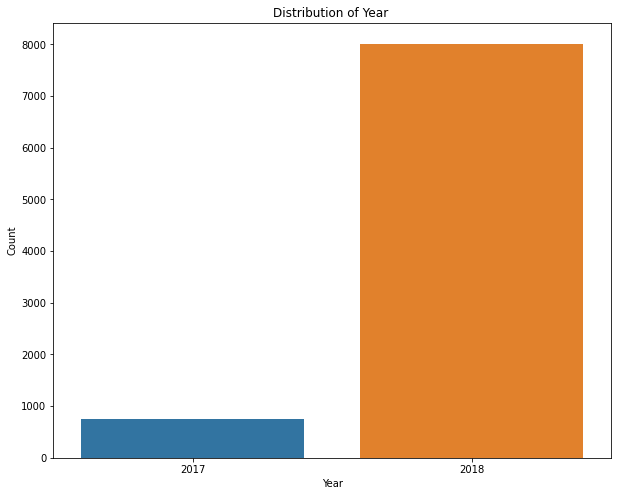

In [14]:
#Count plot of Year column
plt.figure(figsize=(10,8))
sns.countplot(x = data.Year)
plt.xlabel('Year')
plt.ylabel('Count')
plt.title("Distribution of Year ")
plt.show()

In [15]:
#Fetching month from column 'Date' and storing in new column 'Month'
data['Month']=data['Date'].dt.month

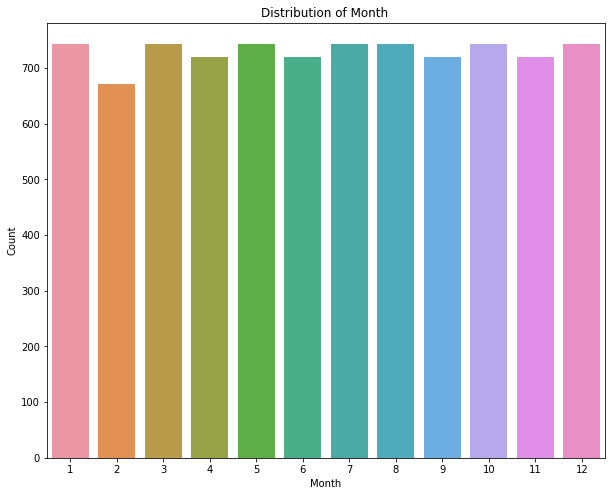

In [16]:
#Count plot of Month column
plt.figure(figsize=(10,8))
sns.countplot(x = data.Month)
plt.xlabel('Month')
plt.ylabel('Count')
plt.title("Distribution of Month ")
plt.show()

In [17]:
#Fetching day from Date and restoring in new column 'Day'
data['Day']=data['Date'].dt.day

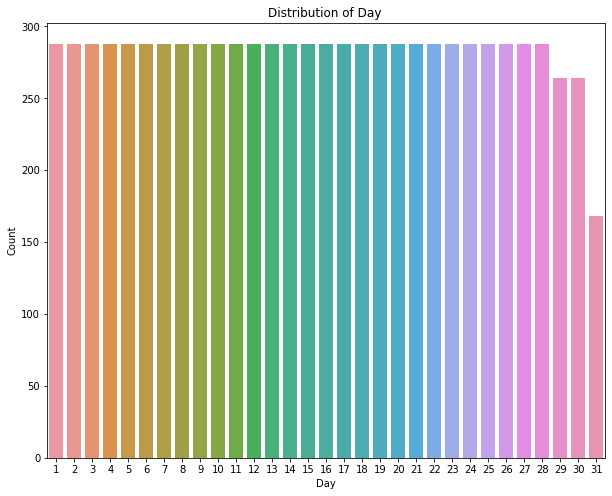

In [18]:
#Count plot of Day column
plt.figure(figsize=(10,8))
sns.countplot(x = data.Day)
plt.xlabel('Day')
plt.ylabel('Count')
plt.title("Distribution of Day ")
plt.show()

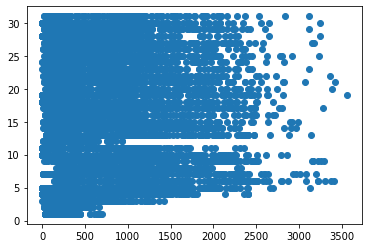

In [19]:
#Scatter plot of Rented bike count vs Day
plt.scatter(data['Rented Bike Count'],data['Day'])

In [20]:
#drop Date column
data=data.drop(columns=["Date"])

In [21]:
data['Hour'].value_counts()

23    365
15    365
8     365
16    365
1     365
9     365
17    365
2     365
10    365
18    365
3     365
11    365
19    365
4     365
12    365
20    365
5     365
13    365
21    365
6     365
14    365
22    365
7     365
0     365
Name: Hour, dtype: int64

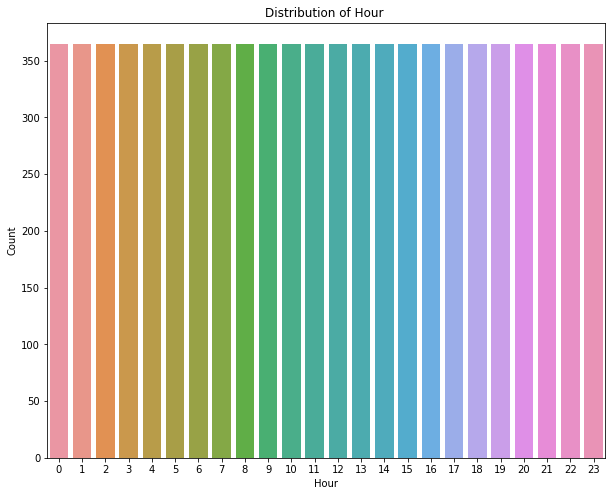

In [22]:
#Count plot of Hour column
plt.figure(figsize=(10,8))
sns.countplot(x = data['Hour'])
plt.xlabel('Hour')
plt.ylabel('Count')
plt.title("Distribution of Hour ")
plt.show()

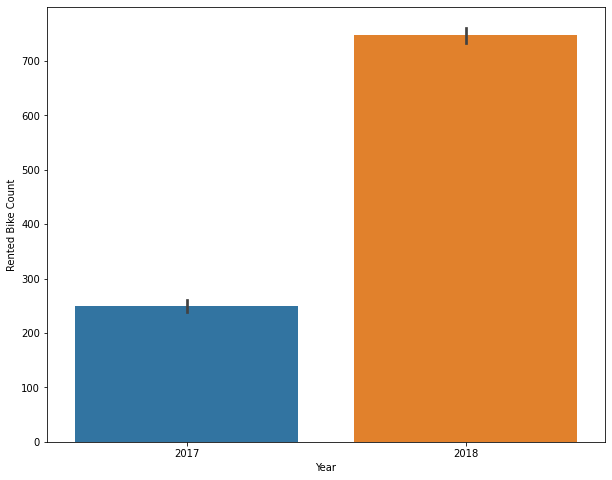

In [23]:
#Rented Bike Count per Year using barplot
plt.figure(figsize=(10,8))
sns.barplot(x = data.Year , y=data['Rented Bike Count'])

The above plot shows that in year 2018 has higher Rented Bike demand

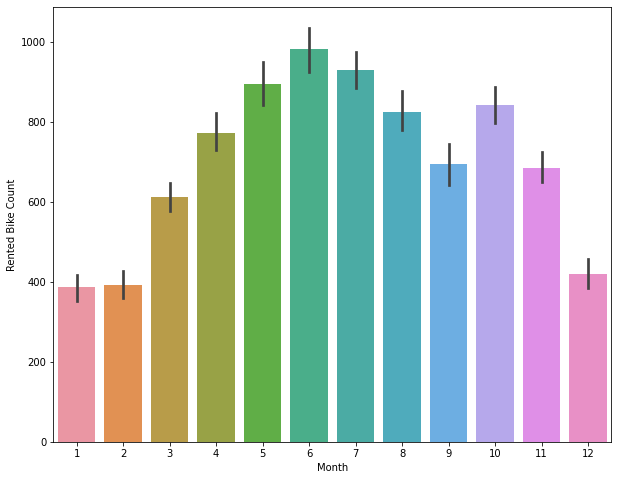

In [24]:
#Rented Bike Count per Month using barplot
plt.figure(figsize=(10,8))
sns.barplot(x = data.Month , y=data['Rented Bike Count'])

The above plot shows that in month may , june & july have higher Rented Bike demand.

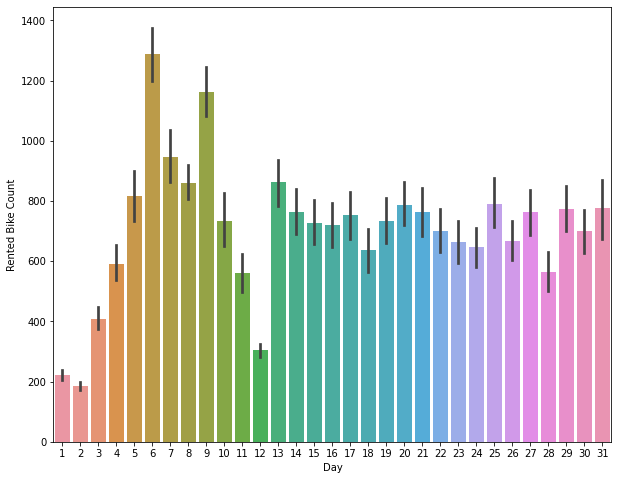

In [25]:
#Rented Bike Count per Day using barplot
plt.figure(figsize=(10,8))
sns.barplot(x = data.Day , y=data['Rented Bike Count'])

The above plot shows that in day 6 , 7 & 9 have higher Rented Bike demand .

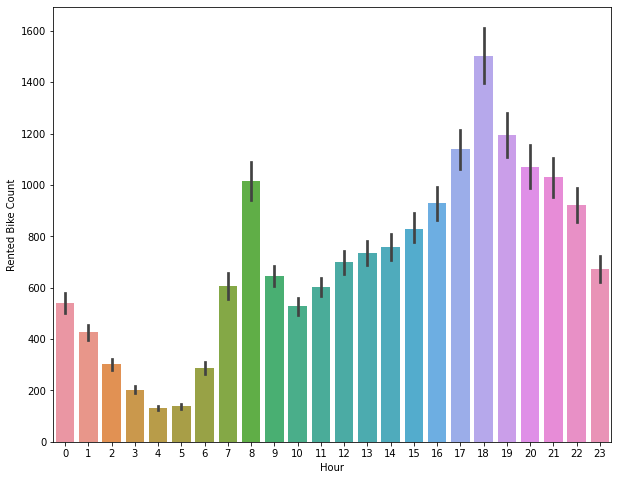

In [26]:
#Rented Bike Count per Hour using barplot
plt.figure(figsize=(10,8))
sns.barplot(x = data.Hour , y=data['Rented Bike Count'])

The above plot shows that in hour 17 , 18 & 19 have higher Rented Bike demand

In [27]:
data['Seasons'].value_counts()

Spring    2208
Summer    2208
Autumn    2184
Winter    2160
Name: Seasons, dtype: int64

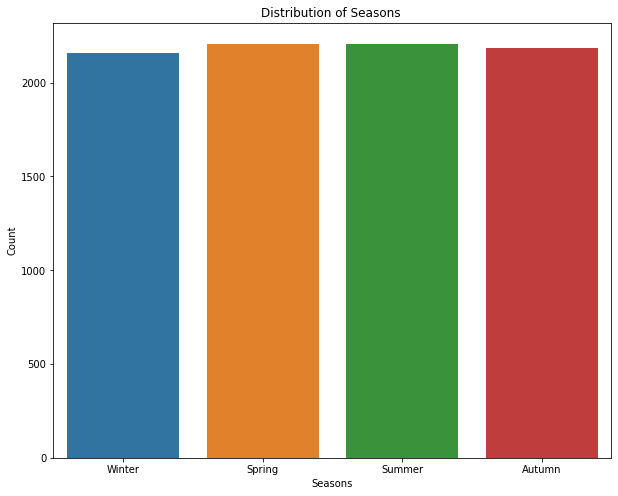

In [28]:
#Countplot of Seasons column
plt.figure(figsize=(10,8))
sns.countplot(x = data.Seasons)
plt.xlabel('Seasons')
plt.ylabel('Count')
plt.title("Distribution of Seasons ")
plt.show()

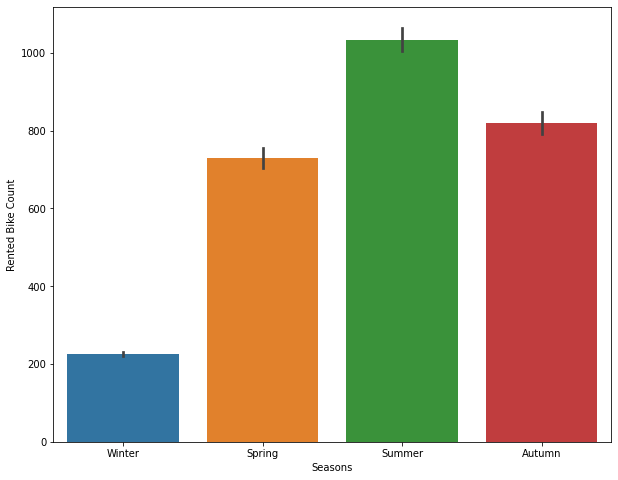

In [29]:
#Rented Bike Count per Seasons using barplot
plt.figure(figsize=(10,8))
sns.barplot(x = data.Seasons , y=data['Rented Bike Count'])

The above plot shows that in Summer, Atumn and, Spring seasons have Higher Rented bike demand.

In [30]:
data['Holiday'].value_counts()

No Holiday    8328
Holiday        432
Name: Holiday, dtype: int64

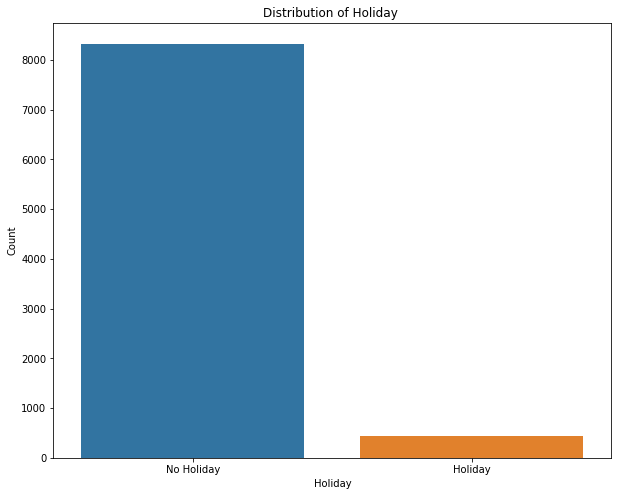

In [31]:
#Count plot of Holiday column
plt.figure(figsize=(10,8))
sns.countplot(x = data.Holiday)
plt.xlabel('Holiday')
plt.ylabel('Count')
plt.title("Distribution of Holiday ")
plt.show()

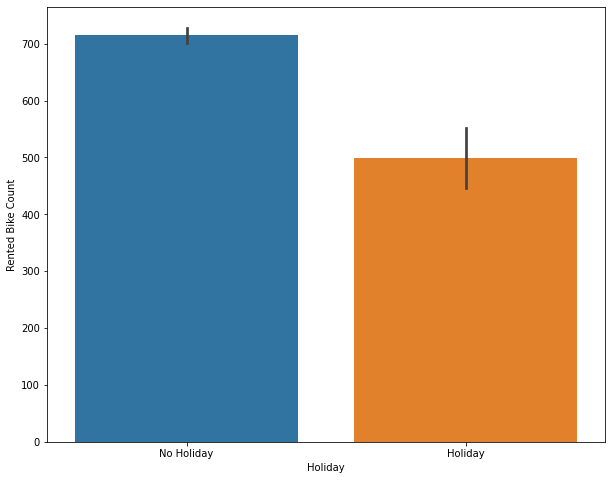

In [32]:
#Rented Bike Count per Holiday using barplot
plt.figure(figsize=(10,8))
sns.barplot(x = data.Holiday , y=data['Rented Bike Count'])

The above plot shows that in No holiday have Higher Rented bike demand.

In [33]:
data['Functioning Day'].value_counts()

Yes    8465
No      295
Name: Functioning Day, dtype: int64

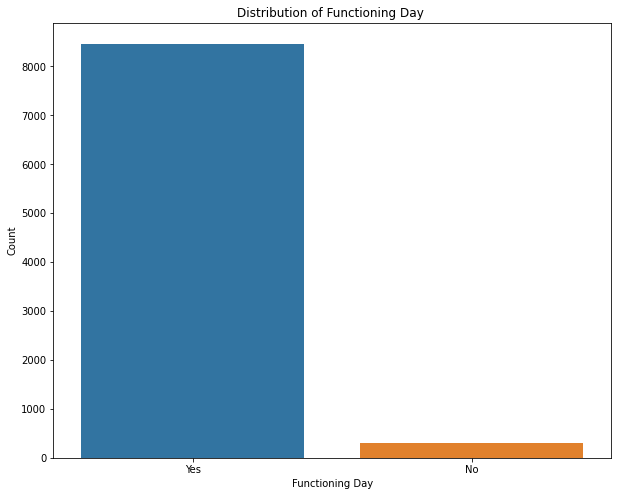

In [34]:
#Countplot of Functioning Day column
plt.figure(figsize=(10,8))
sns.countplot(x = data['Functioning Day'])
plt.xlabel('Functioning Day')
plt.ylabel('Count')
plt.title("Distribution of Functioning Day ")
plt.show()

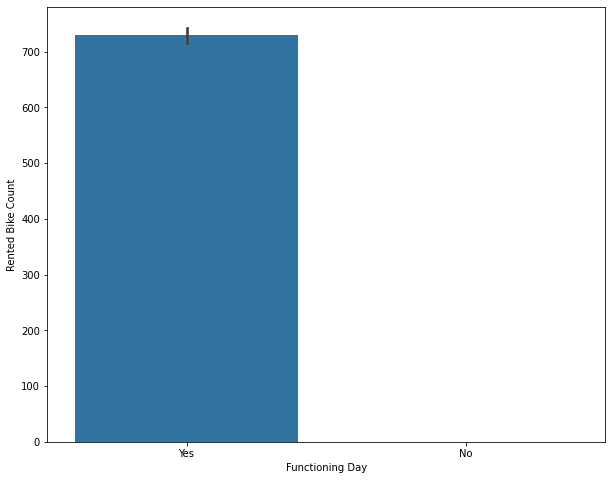

In [35]:
#Rented Bike Count per Hour using barplot
plt.figure(figsize=(10,8))
sns.barplot(x = data['Functioning Day'] , y=data['Rented Bike Count'])

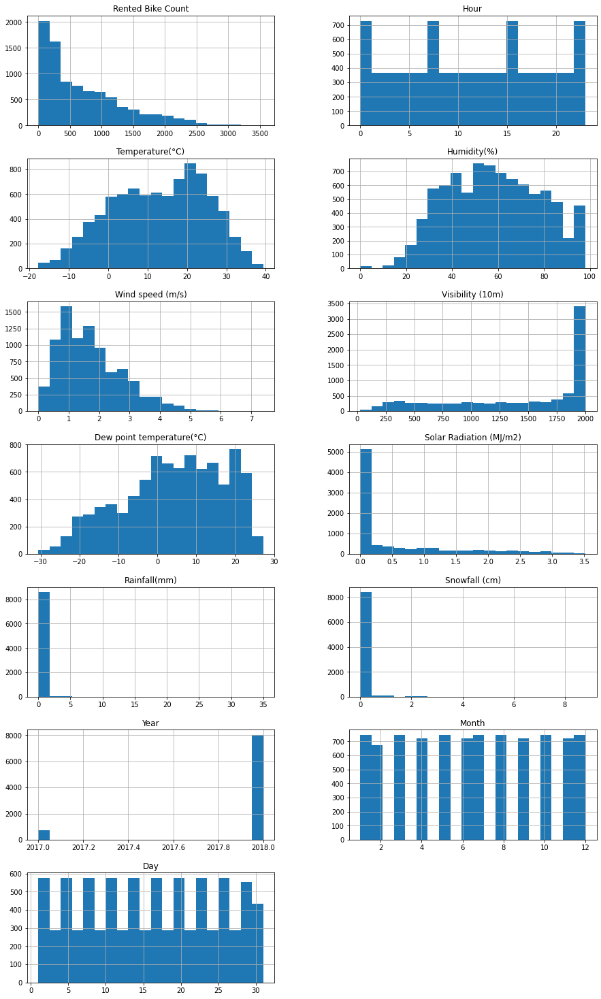

In [36]:
#Histogram plot of all variables
data.hist(bins=20,figsize=(15,30),layout=(8,2)) 
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


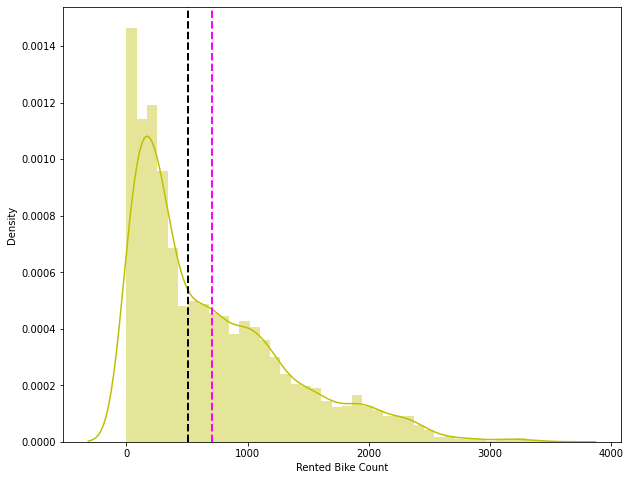

In [37]:
#Distribution plot of Rented Bike Count
plt.figure(figsize=(10,8))
plt.xlabel('Rented Bike Count')
plt.ylabel('Density')
ax=sns.distplot(data['Rented Bike Count'],hist=True ,color="y")
ax.axvline(data['Rented Bike Count'].mean(), color='magenta', linestyle='dashed', linewidth=2)
ax.axvline(data['Rented Bike Count'].median(), color='black', linestyle='dashed', linewidth=2)
plt.show()

The above graph shows that Rented Bike Count has moderate right skewness. Since the assumption of linear regression is that 'the distribution of dependent variable has to be normal', so we should perform some operation to make it normal.

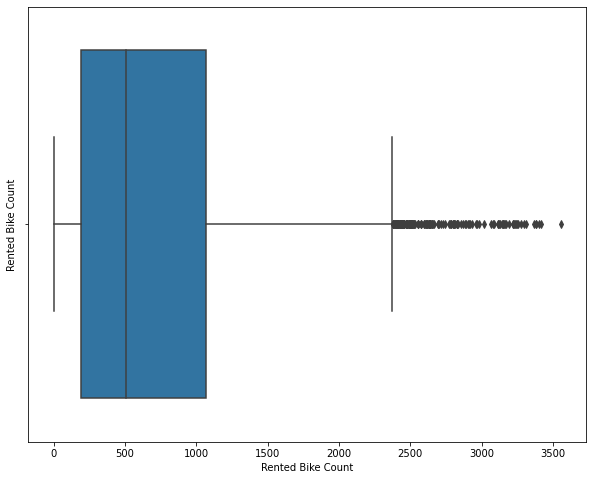

In [38]:
#Boxplot of Rented Bike Count to check outliers
plt.figure(figsize=(10,8))
plt.ylabel('Rented Bike Count')
sns.boxplot(x=data['Rented Bike Count'])
plt.show()

The above boxplot shows that we have detect outliers in Rented Bike Count column

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


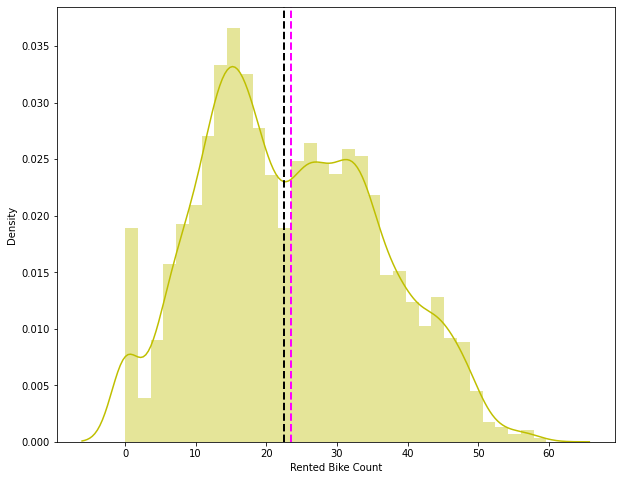

In [39]:
#Applying square root to Rented Bike Count to improve skewness
plt.figure(figsize=(10,8))
plt.xlabel('Rented Bike Count')
plt.ylabel('Density')

ax=sns.distplot(np.sqrt(data['Rented Bike Count']), color="y")
ax.axvline(np.sqrt(data['Rented Bike Count']).mean(), color='magenta', linestyle='dashed', linewidth=2)
ax.axvline(np.sqrt(data['Rented Bike Count']).median(), color='black', linestyle='dashed', linewidth=2)

plt.show()

Since we have generic rule of applying Square root for the skewed variable in order to make it normal .After applying Square root to the skewed Rented Bike Count, here we get almost normal distribution.

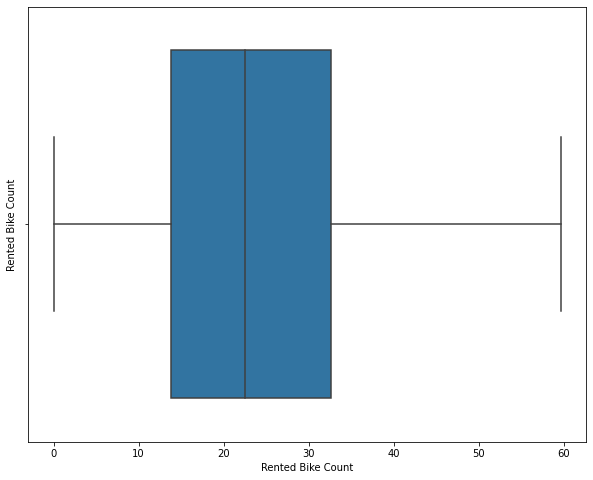

In [40]:
#After applying sqrt on Rented Bike Count check wheater we still have outliers 
plt.figure(figsize=(10,8))

plt.ylabel('Rented Bike Count')
sns.boxplot(x=np.sqrt(data['Rented Bike Count']))
plt.show()

After applying Square root to the Rented Bike Count column , there is no outliers

In [41]:
# Renaming the columns by removing their units.
data.rename({"Temperature(°C)": "Temperature", 
           "Functioning Day":"Functioning_Day",
           "Humidity(%)": "Humidity", 
           "Wind speed (m/s)": "Wind_speed",
           "Visibility (10m)": "Visibility",
           "Dew point temperature(°C)": "Dew_point_temperature", 
           "Solar Radiation (MJ/m2)": "Solar_Radiation",
           "Snowfall (cm)": "Snowfall",
           "Rainfall(mm)": "Rainfall", 
           "Rented Bike Count": "Rented_Bike_Count"},   axis = "columns", inplace = True) 

In [42]:
box_column = ['Hour','Temperature','Humidity', 'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation','Rainfall','Snowfall','Month','Day','Year']

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


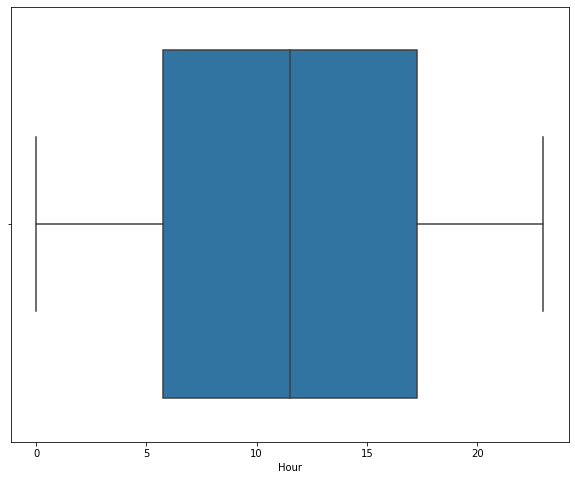

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


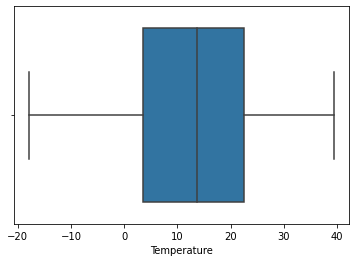

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


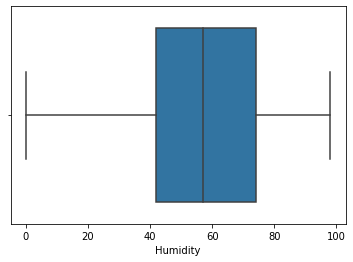

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


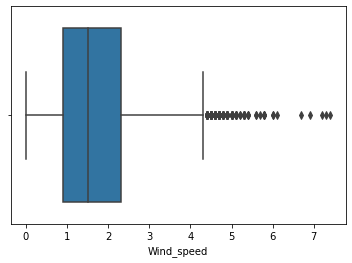

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


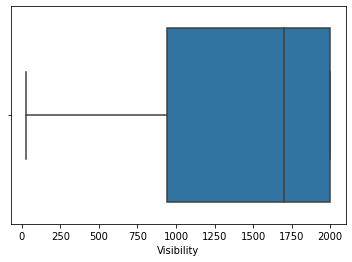

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


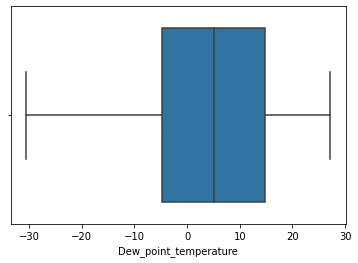

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


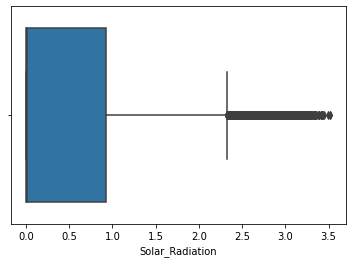

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


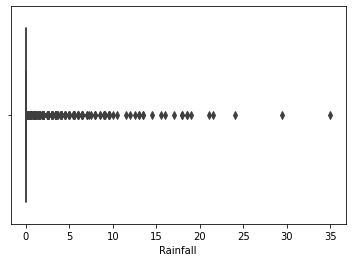

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


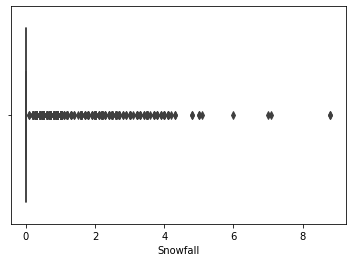

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


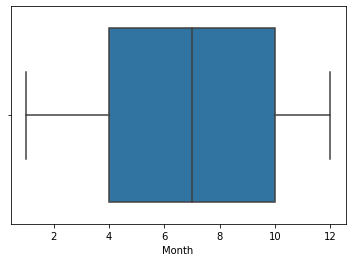

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


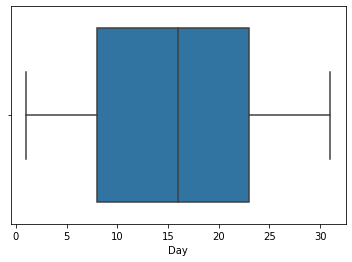

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


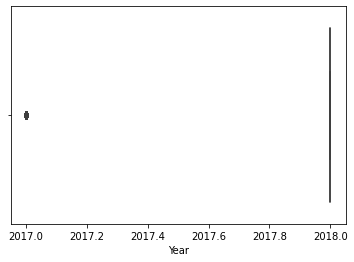

In [43]:
#Boxplot of all the column in dataset
plt.figure(figsize=(10,8))
for i in box_column:
  sns.boxplot(data[i])
  plt.show()

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


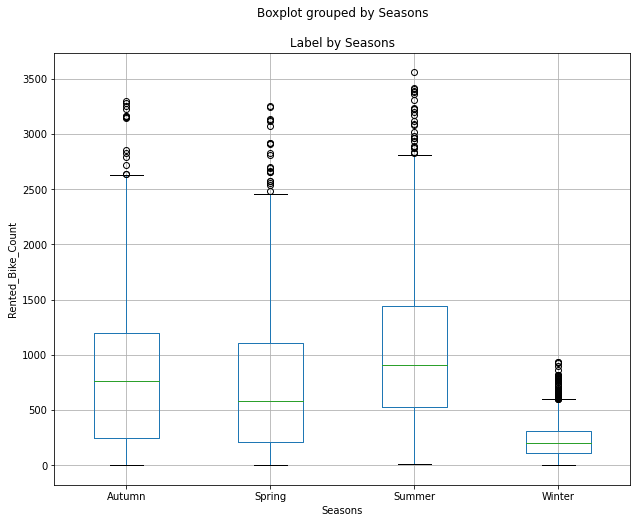

In [44]:
#Distribution of outliers in Season with respect to Rented Bike Count(dependent variable)
fig = plt.figure(figsize=(10, 8))
ax = fig.gca()
data.boxplot(column = 'Rented_Bike_Count', by ='Seasons', ax = ax)
ax.set_title('Label by ' + 'Seasons')
ax.set_ylabel("Rented_Bike_Count")
plt.show()

From above graph we can notice that ouliers in Autumn, Spring ,Summer is after 2400 of Rented bike count and for winter the ouliers are above 600 Rented bike count.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


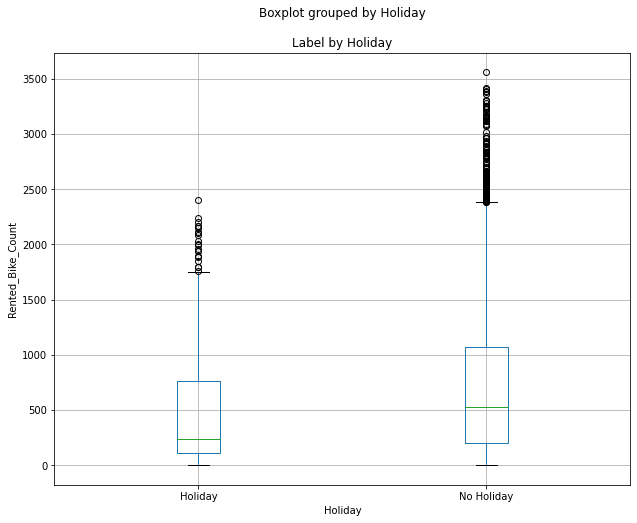

In [45]:
#Distribution of outliers in Holiday with respect to Rented Bike Count(dependent variable)

fig = plt.figure(figsize=(10, 8))
ax = fig.gca()
data.boxplot(column = 'Rented_Bike_Count', by ='Holiday', ax = ax)
ax.set_title('Label by ' + 'Holiday')
ax.set_ylabel("Rented_Bike_Count")
plt.show()

For Holiday the outliers are after 1700 of Rented bike count but for No Holiday the outliers are above almost 2400 of Rented bike count

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


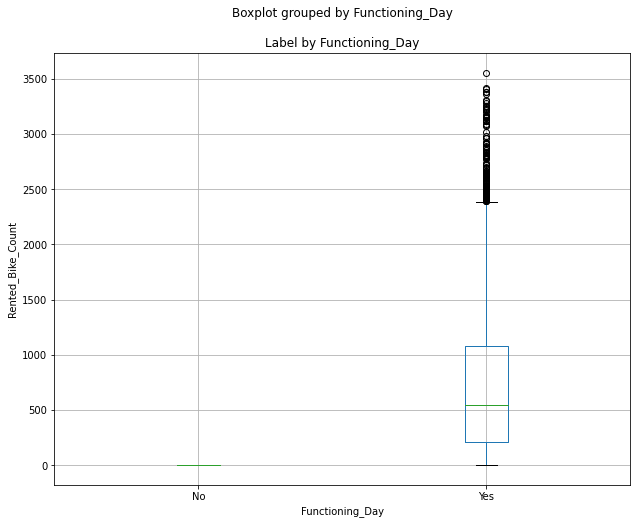

In [46]:
#Distribution of outliers in Functioning_Day with respect to Rented Bike Count(dependent variable)
fig = plt.figure(figsize=(10, 8))
ax = fig.gca()
data.boxplot(column = 'Rented_Bike_Count', by ='Functioning_Day', ax = ax)
ax.set_title('Label by ' + 'Functioning_Day')
ax.set_ylabel("Rented_Bike_Count")
plt.show()

For Functioning_day= Yes the ouliers are after 2400 of Rented Bike count

In [47]:
#Dropping Functinality_Day column
data=data.drop(columns=['Functioning_Day'])

In [48]:
categorical_variables = ['Seasons', 'Holiday']
categorical_variables

['Seasons', 'Holiday']

In [49]:
#Corelation of dataset column
data.corr()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Year,Month,Day
Rented_Bike_Count,1.000000,4.102573e-01,0.538558,-0.199780,0.121108,0.199280,0.379788,0.261837,-0.123074,-0.141804,0.215162,7.086107e-02,4.684885e-02
Hour,0.410257,1.000000e+00,0.124114,-0.241644,0.285197,0.098753,0.003054,0.145131,0.008715,-0.021516,0.000000,2.684858e-18,1.598551e-19
Temperature,0.538558,1.241145e-01,1.000000,0.159371,-0.036252,0.034794,0.912798,0.353505,0.050282,-0.218405,0.377796,4.968327e-02,8.090791e-02
Humidity,-0.199780,-2.416438e-01,0.159371,1.000000,-0.336683,-0.543090,0.536894,-0.461919,0.236397,0.108183,0.035925,4.779778e-02,7.047359e-03
Wind_speed,0.121108,2.851967e-01,-0.036252,-0.336683,1.000000,0.171507,-0.176486,0.332274,-0.019674,-0.003554,-0.003781,-8.206909e-02,-6.123440e-02
Visibility,0.199280,9.875348e-02,0.034794,-0.543090,0.171507,1.000000,-0.176630,0.149738,-0.167629,-0.121695,0.052381,7.788783e-02,-1.068595e-01
Dew_point_temperature,0.379788,3.054372e-03,0.912798,0.536894,-0.176486,-0.176630,1.000000,0.094381,0.125597,-0.150887,0.336350,6.510073e-02,6.970777e-02
Solar_Radiation,0.261837,1.451309e-01,0.353505,-0.461919,0.332274,0.149738,0.094381,1.000000,-0.074290,-0.072301,0.128086,-3.041240e-02,-3.445555e-03
Rainfall,-0.123074,8.714642e-03,0.050282,0.236397,-0.019674,-0.167629,0.125597,-0.074290,1.000000,0.008500,0.027522,-2.279368e-02,1.199827e-02
Snowfall,-0.141804,-2.151645e-02,-0.218405,0.108183,-0.003554,-0.121695,-0.150887,-0.072301,0.008500,1.000000,-0.206418,5.475846e-02,1.014355e-01


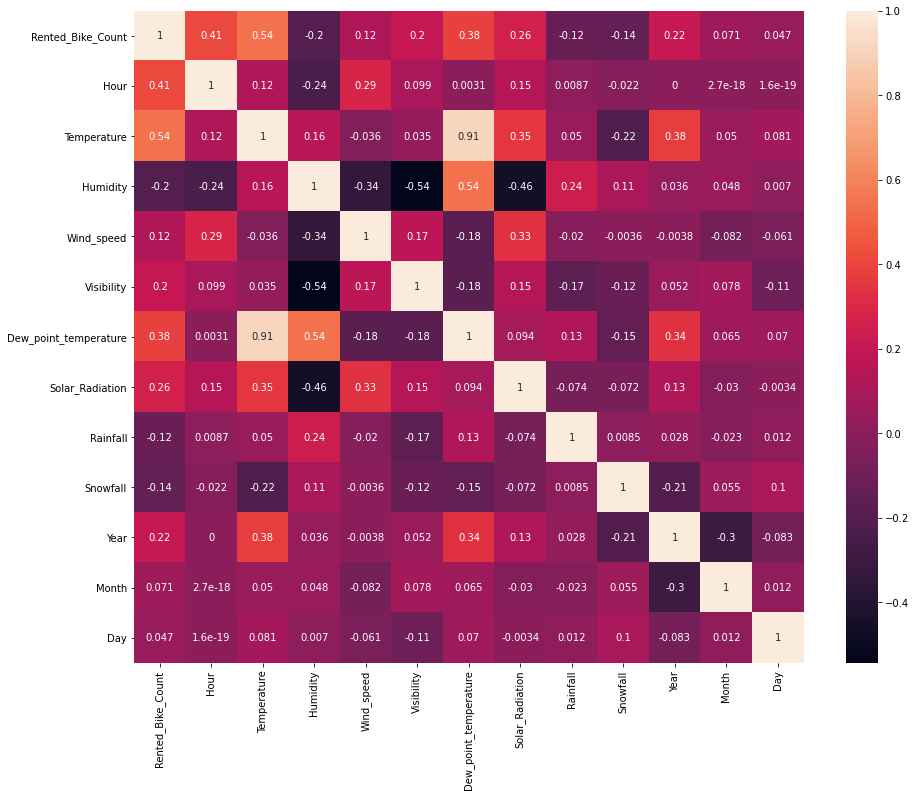

In [50]:
#Correlation graph
plt.figure(figsize=(15,12))
sns.heatmap(data.corr(),annot=True)

There is high correlation between Temperature and Dew_point_temperature. 

In [51]:
#Applying one hot encoding in categorical feature(seasons ,holiday)
data = pd.get_dummies(data=data, columns=categorical_variables , drop_first=True)

In [52]:
data.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Year,Month,Day,Seasons_Spring,Seasons_Summer,Seasons_Winter,Holiday_No Holiday
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,2017,1,12,0,0,1,1
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,2017,1,12,0,0,1,1
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,2017,1,12,0,0,1,1
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,2017,1,12,0,0,1,1
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,2017,1,12,0,0,1,1


In [53]:
#Checking multicollinearity using VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [54]:
#Dropping dependent variable
calc_vif(data.drop(columns=['Rented_Bike_Count']))

,variables,VIF
0,Hour,4.557278
1,Temperature,194.046442
2,Humidity,188.826538
3,Wind_speed,4.917761
4,Visibility,11.413647
5,Dew_point_temperature,128.620821
6,Solar_Radiation,2.930714
7,Rainfall,1.105131
8,Snowfall,1.176464
9,Year,449.552516


In [55]:
#Dropping "Dew_point_temperature" because of high correlation
calc_vif(data.drop(columns=['Rented_Bike_Count','Dew_point_temperature']))

,variables,VIF
0,Hour,4.551793
1,Temperature,11.169601
2,Humidity,24.585207
3,Wind_speed,4.910945
4,Visibility,11.379109
5,Solar_Radiation,2.803319
6,Rainfall,1.090457
7,Snowfall,1.169977
8,Year,110.260859
9,Month,5.598631


In [56]:
#Assinging Year, Month, Day to one variable
Date=['Year','Month','Day']

In [57]:
#Applying labelEncoder to above variable
from sklearn.preprocessing import LabelEncoder
encode=LabelEncoder()

In [58]:
data[Date]=data[Date].apply(lambda X: encode.fit_transform(X))

In [59]:
calc_vif(data.drop(columns=['Rented_Bike_Count','Dew_point_temperature','Year']))

,variables,VIF
0,Hour,4.381532
1,Temperature,10.832229
2,Humidity,11.995628
3,Wind_speed,4.840663
4,Visibility,6.792383
5,Solar_Radiation,2.575039
6,Rainfall,1.086285
7,Snowfall,1.156749
8,Month,4.064945
9,Day,3.687860


In [60]:
#Assiging dependent and numerical columns
numerical_columns=data.describe().columns.to_list()
dependent_variable='Rented_Bike_Count'

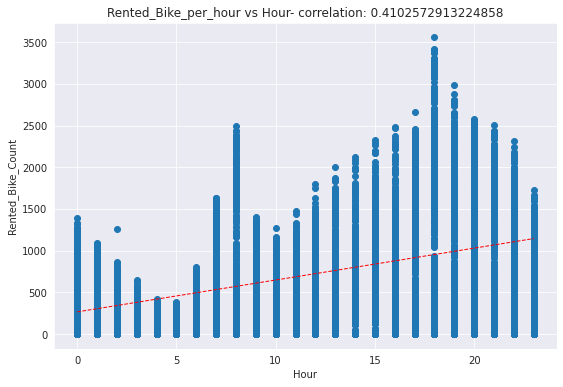

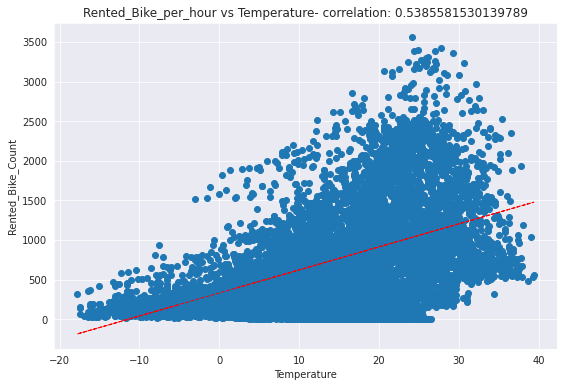

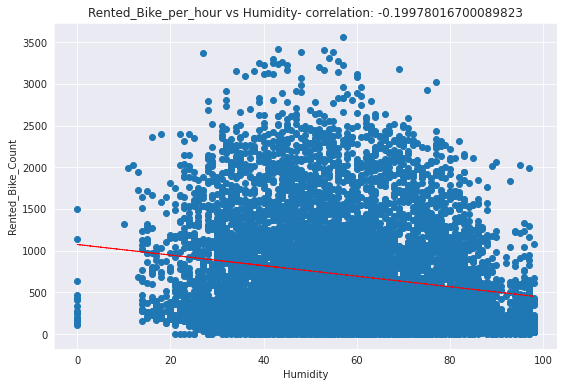

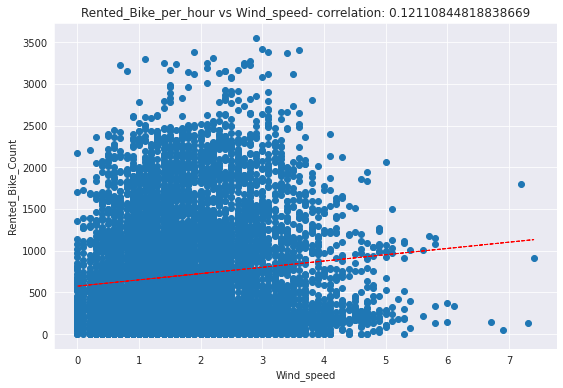

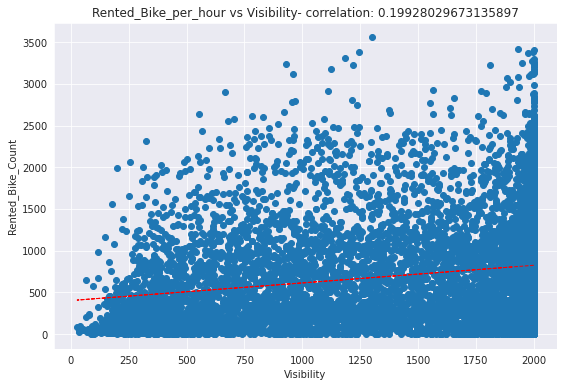

...

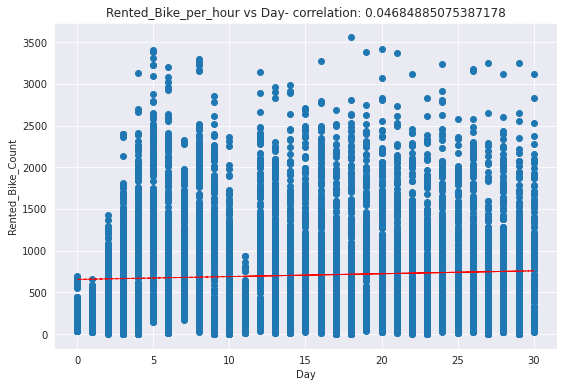

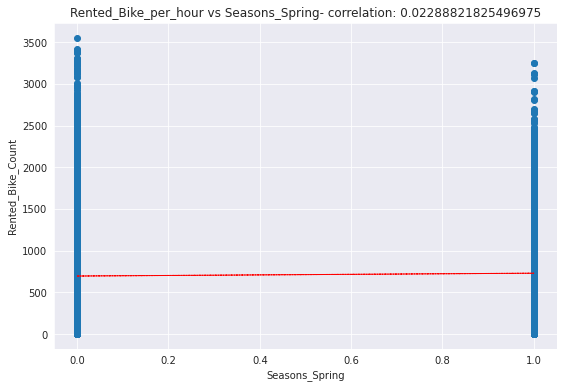

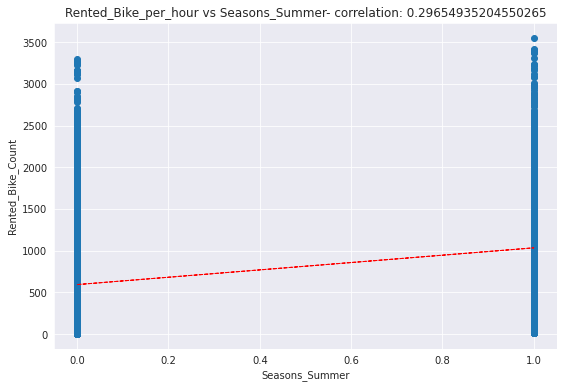

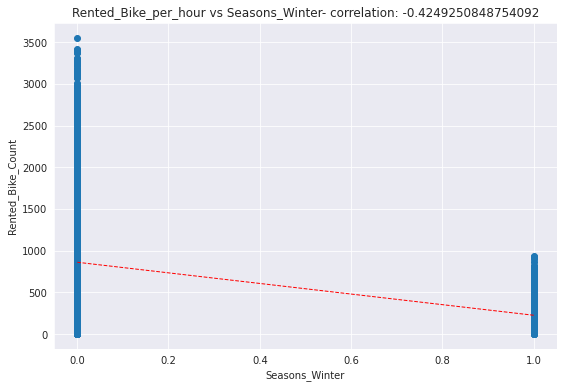

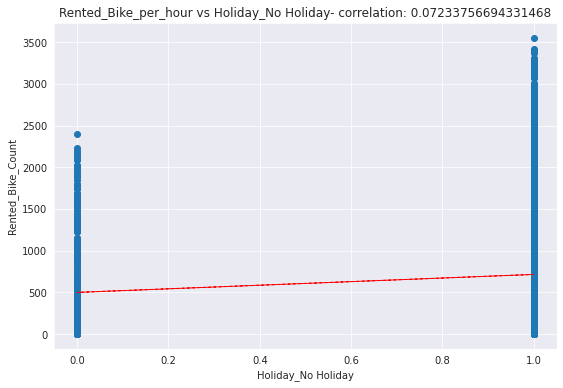

In [61]:
#Scatter plot between independent with the dependent variable
sns.set_style('darkgrid')
for col in numerical_columns:
    if col !=dependent_variable:
        fig = plt.figure(figsize=(9, 6))
        ax = fig.gca()
        feature = data[col]
        label = data[dependent_variable]
        correlation = feature.corr(label)
        plt.scatter(x=feature, y=label)
        plt.xlabel(col)
        plt.ylabel(dependent_variable)
        ax.set_title('Rented_Bike_per_hour vs ' + col + '- correlation: ' + str(correlation))
        z = np.polyfit(data[col], data[dependent_variable], 1)
        y_hat = np.poly1d(z)(data[col])

        plt.plot(data[col], y_hat, "r--", lw=1)

plt.show()

The above graphs are the correlation between dependent and independent variable.

In [62]:
column_name = ['Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall', 'Year', 'Month', 'Day', 'Seasons_Spring', 'Seasons_Summer',
       'Seasons_Winter', 'Holiday_No Holiday']

In [63]:
#Assigning values to independent variables
X=data.drop('Rented_Bike_Count',axis=1)
X.head()

,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Year,Month,Day,Seasons_Spring,Seasons_Summer,Seasons_Winter,Holiday_No Holiday
0,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,0,11,0,0,1,1
1,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,0,0,11,0,0,1,1
2,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,0,11,0,0,1,1
3,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,0,11,0,0,1,1
4,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,0,11,0,0,1,1


In [64]:
#Assigning values to dependent variables
y=data['Rented_Bike_Count']
y = np.sqrt(y)
y.head()

0    15.937377
1    14.282857
2    13.152946
3    10.344080
4     8.831761
Name: Rented_Bike_Count, dtype: float64

In [65]:
#Splitting data into train and test split
from sklearn.model_selection import train_test_split 
X_train, X_test, y_train, y_test = train_test_split(X , y , test_size = 0.2 , random_state = 42) 
print(X_train.shape)
print(X_test.shape)

(7008, 16)
(1752, 16)


##Linear Regression

In [66]:
#Fitting model to linear regression
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(X_train, y_train)

In [67]:
#Regression score 
reg.score(X_train, y_train)

0.49913112943723636

In [68]:
#Intercept value
reg.intercept_

27.565735440655914

In [69]:
#Co-efficient values
reg.coef_

array([ 5.27794267e-01,  1.42873551e-01, -2.34999414e-01, -6.21073386e-03,
       -6.00834680e-05,  2.78352903e-01, -6.55238530e-01, -1.56457086e+00,
        1.55116950e-01, -1.88836272e+00,  7.22835285e-02,  3.23476380e-02,
       -3.00230424e-01,  1.16698497e+00, -6.49626948e+00,  3.57869906e+00])

In [70]:
y_pred_train = reg.predict(X_train)

In [71]:
#Import libraries for evaluation metrix
from sklearn.metrics import r2_score,mean_absolute_error
from sklearn.metrics import mean_squared_error
MAE  = mean_absolute_error(y_train**2,y_pred_train**2)
MSE  = mean_squared_error(y_train**2, y_pred_train**2)
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(y_train**2, y_pred_train**2)
print("r2 :", r2 )

print("Adjusted R2 : ",1-(1-r2_score((y_train**2), (y_pred_train**2)))*((X_train.shape[0]-1)/(X_train.shape[0]-X_train.shape[1]-1)))

MAE : 311.3623580583388
MSE : 209323.37520761992
RMSE : 457.51871569108505
r2 : 0.49658417190901794
Adjusted R2 :  0.4954320258284206


In [72]:
y_pred_test = reg.predict(X_test)

In [73]:
MAE  = mean_absolute_error(y_test**2,y_pred_test**2)
MSE  = mean_squared_error(y_test**2, y_pred_test**2)
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(y_test**2, y_pred_test**2)
print("R2 :" ,r2)

print("Adjusted R2 : ",1-(1-r2_score((y_test**2), (y_pred_test**2)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

MAE : 310.4642602437403
MSE : 212180.40881329833
RMSE : 460.6304471192697
R2 : 0.49074205018556105
Adjusted R2 :  0.48604572327084583


Text(0, 0.5, 'Predicted')

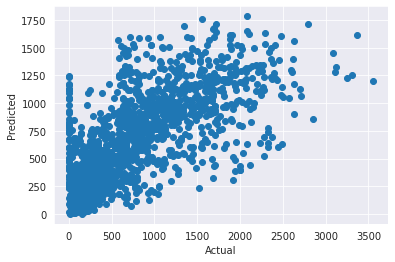

In [74]:
#Scatterplot of linear regression
plt.scatter(y_test**2, y_pred_test**2)
plt.xlabel('Actual')
plt.ylabel('Predicted')

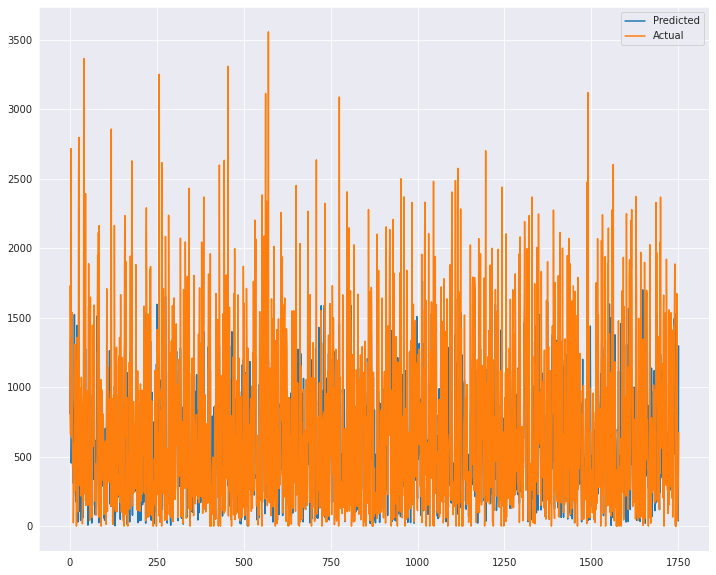

In [75]:
#Plot of actual and predicted waveform
plt.figure(figsize=(12,10))
plt.plot(y_pred_test**2)
plt.plot(np.array(y_test**2))
plt.legend(["Predicted","Actual"])
plt.show()

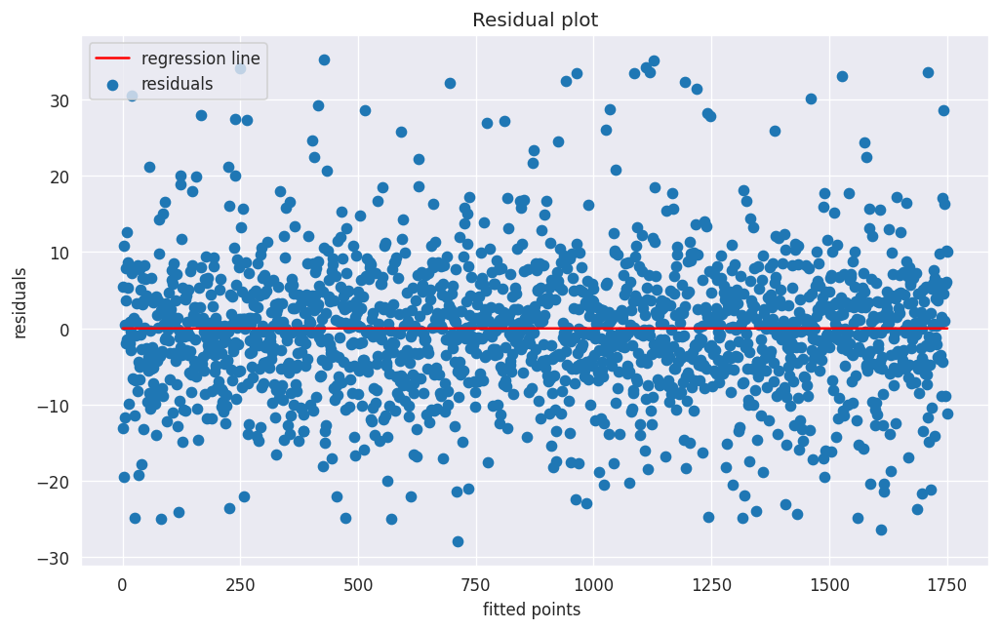

In [76]:
#Heteroskedasticity
residuals=y_pred_test-y_test

plt.figure(figsize=(10, 6), dpi=120, facecolor='w', edgecolor='b')
f = range(0,len(y_test))
k = [0 for i in range(0,len(y_test))]
plt.scatter( f, residuals, label = 'residuals')
plt.plot( f, k , color = 'red', label = 'regression line' )
plt.xlabel('fitted points ')
plt.ylabel('residuals')
plt.title('Residual plot')
plt.legend()

Feature: 0, Score: 0.52779
Feature: 1, Score: 0.14287
Feature: 2, Score: -0.23500
Feature: 3, Score: -0.00621
Feature: 4, Score: -0.00006
Feature: 5, Score: 0.27835
Feature: 6, Score: -0.65524
Feature: 7, Score: -1.56457
Feature: 8, Score: 0.15512
Feature: 9, Score: -1.88836
Feature: 10, Score: 0.07228
Feature: 11, Score: 0.03235
Feature: 12, Score: -0.30023
Feature: 13, Score: 1.16698
Feature: 14, Score: -6.49627
Feature: 15, Score: 3.57870


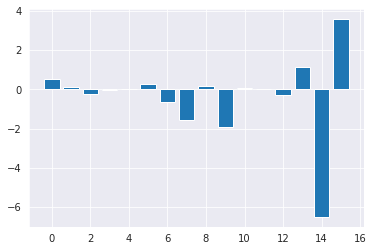

In [77]:
import matplotlib.pyplot as plt 
importance = reg.coef_

# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

##Polynomial Regression

In [78]:
#Fitting model to Polynomial regression
from sklearn.preprocessing import PolynomialFeatures

poly_features = PolynomialFeatures(degree=2)
X_train_poly = poly_features.fit_transform(X_train)
poly_model = LinearRegression()
poly_model.fit(X_train_poly, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [79]:
#intercept value
poly_model.intercept_

13.913223861453183

In [80]:
#co-efficient values
poly_model.coef_

array([ 9.34463007e-09,  1.60737458e+00,  9.01700213e-01,  1.00618428e+00,
        6.04836881e+00,  2.62179649e-03, -1.47253162e+00, -1.30158016e+01,
        6.59155617e+01, -1.55018867e+01, -1.21965127e+01, -3.25960615e+00,
        2.83828733e-01,  1.87410011e+00,  3.20696292e+01, -6.97289701e-01,
       -3.18933161e+01,  6.82573596e-03, -4.11426470e-02, -2.35498823e-02,
        1.95966034e-02,  9.74841456e-06,  6.42671768e-02,  1.55696518e-01,
       -3.50483410e-02,  7.09805238e-02,  1.98451529e-02,  1.56661011e-02,
        1.07378077e-03,  3.79311053e-02,  7.97299494e-02, -4.90083501e-02,
        2.49262121e-01,  6.15318281e-02, -8.31090405e-03,  1.34151676e-02,
        1.25812579e-04, -5.25412376e-02,  1.89119053e-01, -5.41921027e+00,
        4.03751535e-01, -8.03030001e-01, -6.79933692e-02, -1.85858559e-02,
       -3.59623168e-01, -3.25192343e+00,  3.06168506e-01, -3.67741115e-02,
       -5.73682306e-03, -4.24842736e-02,  4.89345981e-05,  1.85322129e-02,
        2.43087161e-01, -

In [81]:
y_pred_train = poly_model.predict(poly_features.fit_transform(X_train))

In [82]:
MAE  = mean_absolute_error(y_train**2,y_pred_train**2)
MSE  = mean_squared_error(y_train**2, y_pred_train**2)
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(y_train**2, y_pred_train**2)
print("r2 :", r2 )

print("Adjusted R2 : ",1-(1-r2_score((y_train**2), (y_pred_train**2)))*((X_train.shape[0]-1)/(X_train.shape[0]-X_train.shape[1]-1)))

MAE : 257.7066085382485
MSE : 147287.00643130537
RMSE : 383.77989320873155
r2 : 0.6457795970654774
Adjusted R2 :  0.6449689081158346


In [83]:
y_test_pred = poly_model.predict(poly_features.fit_transform(X_test))

In [84]:
MAE  = mean_absolute_error(y_test**2,y_test_pred**2)
MSE  = mean_squared_error(y_test**2, y_test_pred**2)
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(y_test**2, y_test_pred**2)
print("R2 :" ,r2)

print("Adjusted R2 : ",1-(1-r2_score((y_test**2), (y_test_pred**2)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

MAE : 261.0418040984325
MSE : 157783.58472531408
RMSE : 397.21981914969206
R2 : 0.6213008292283476
Adjusted R2 :  0.6178085025814621


Text(0, 0.5, 'Predicted')

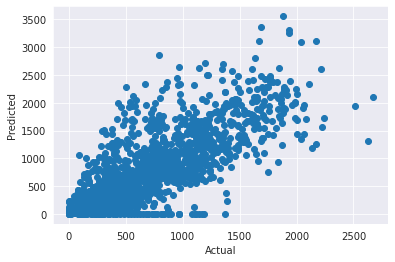

In [85]:
#Scatterplot of polynomial regression
plt.scatter(y_test_pred**2, y_test**2)
plt.xlabel('Actual')
plt.ylabel('Predicted')

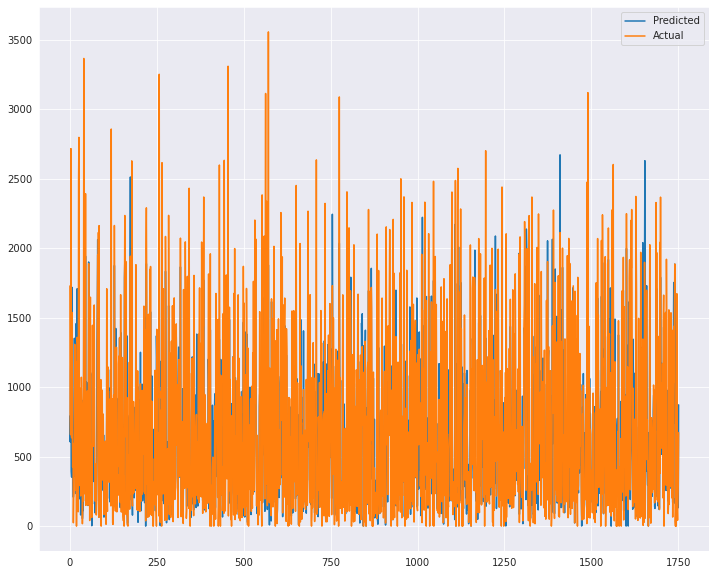

In [86]:
#Plot of actual and predicted waveform
plt.figure(figsize=(12,10))
plt.plot(y_test_pred**2)
plt.plot(np.array(y_test**2))
plt.legend(["Predicted","Actual"])
plt.show()

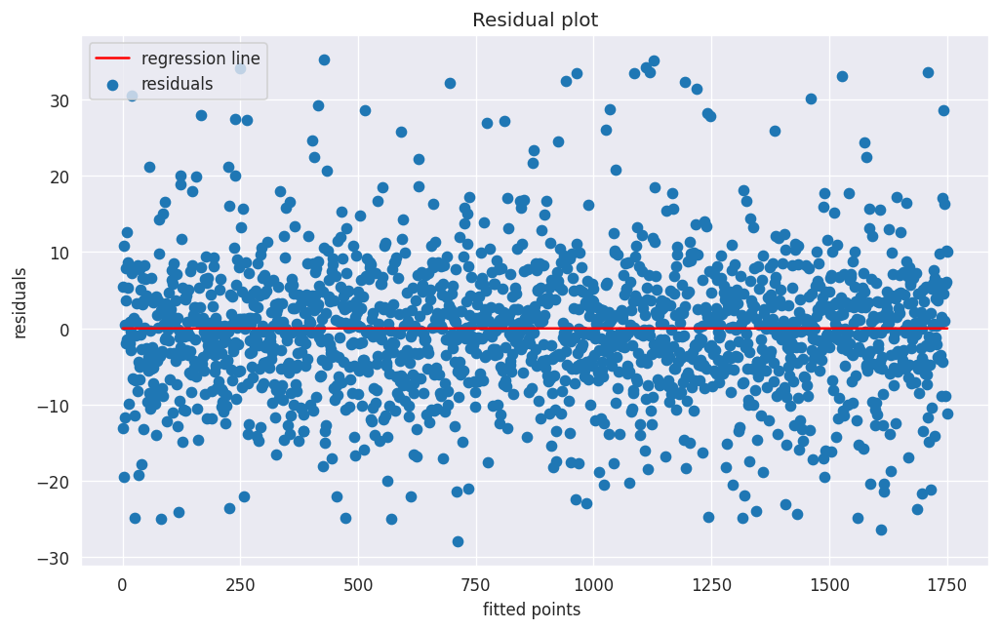

In [87]:
#Heteroskedasticity
residuals=y_pred_test-y_test

plt.figure(figsize=(10, 6), dpi=120, facecolor='w', edgecolor='b')
f = range(0,len(y_test))
k = [0 for i in range(0,len(y_test))]
plt.scatter( f, residuals, label = 'residuals')
plt.plot( f, k , color = 'red', label = 'regression line' )
plt.xlabel('fitted points ')
plt.ylabel('residuals')
plt.title('Residual plot')
plt.legend()

Feature: 0, Score: 0.00000
Feature: 1, Score: 1.60737
Feature: 2, Score: 0.90170
Feature: 3, Score: 1.00618
Feature: 4, Score: 6.04837
Feature: 5, Score: 0.00262
Feature: 6, Score: -1.47253
Feature: 7, Score: -13.01580
Feature: 8, Score: 65.91556
Feature: 9, Score: -15.50189
Feature: 10, Score: -12.19651
Feature: 11, Score: -3.25961
Feature: 12, Score: 0.28383
Feature: 13, Score: 1.87410
Feature: 14, Score: 32.06963
Feature: 15, Score: -0.69729
Feature: 16, Score: -31.89332
Feature: 17, Score: 0.00683
Feature: 18, Score: -0.04114
Feature: 19, Score: -0.02355
Feature: 20, Score: 0.01960
Feature: 21, Score: 0.00001
Feature: 22, Score: 0.06427
Feature: 23, Score: 0.15570
Feature: 24, Score: -0.03505
Feature: 25, Score: 0.07098
Feature: 26, Score: 0.01985
Feature: 27, Score: 0.01567
Feature: 28, Score: 0.00107
Feature: 29, Score: 0.03793
Feature: 30, Score: 0.07973
Feature: 31, Score: -0.04901
Feature: 32, Score: 0.24926
Feature: 33, Score: 0.06153
Feature: 34, Score: -0.00831
Feature: 35,

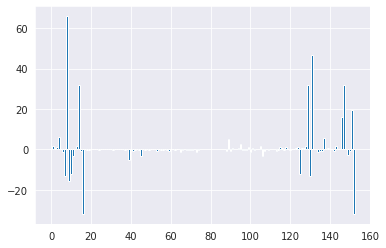

In [88]:
import matplotlib.pyplot as plt 
importance = poly_model.coef_

# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

##Linear regression model from statsmodels.api

In [89]:
#Statistical summary of dataset
import statsmodels.api as sm
X = sm.add_constant(X) 
model = sm.OLS(y, X).fit() 
predictions = model.predict(X)
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      Rented_Bike_Count   R-squared:                       0.499
Model:                            OLS   Adj. R-squared:                  0.498
Method:                 Least Squares   F-statistic:                     544.6
Date:                Sat, 22 May 2021   Prob (F-statistic):               0.00
Time:                        08:03:09   Log-Likelihood:                -31492.
No. Observations:                8760   AIC:                         6.302e+04
Df Residuals:                    8743   BIC:                         6.314e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    29.6097      2.109     14.040      0.000      25.476      33.744
Hour                      0.5124      0.015     34.187      0.000       0.483       0.542
Temperature               0.1118      0.075      1.495      0.135      -0.035       0.258
Humidity                 -0.2507      0.021    -11.930      0.000      -0.292      -0.210
Wind_speed                0.0025      0.104      0.024      0.981      -0.201       0.206
Visibility            -8.247e-05      0.000     -0.404      0.686      -0.000       0.000
Dew_point_temperature     0.3173      0.078      4.061      0.000       0.164       0.470
Solar_Radiation          -0.6434      0.155     -4.142      0.000      -0.948      -0.339
Rainfall                 -1.4928      0.087    -17.146      0.000      -1.663      -1.322
Snowfall                  0.2352      0.231      1.019      0.308      -0.217       0.688
Year                     -2.0954      0.470     -4.461      0.000      -3.016      -1.175
Month                     0.0401      0.035      1.155      0.248      -0.028       0.108
Day                       0.0247      0.011      2.204      0.028       0.003       0.047
Seasons_Spring           -0.3309      0.310     -1.068      0.286      -0.938       0.277
Seasons_Summer            1.1149      0.344      3.244      0.001       0.441       1.789
Seasons_Winter           -6.6334      0.491    -13.502      0.000      -7.596      -5.670
Holiday_No Holiday        3.4302      0.442      7.769      0.000       2.565       4.296
==============================================================================
Omnibus:                      881.979   Durbin-Watson:                   0.383
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2181.405
Skew:                          -0.593   Prob(JB):                         0.00
Kurtosis:                       5.138   Cond. No.                     3.52e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.52e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

R sqauare and Adjusted R Square are same,that is 49% which means the 49% variance of dependent variable is explained by independent variables.    
P value of visibility and day are very high and they are not significant.

##Lasso Regression

In [90]:
#Fit lasso regression
from sklearn.linear_model import Lasso

# set hyper parameter=0.01
lasso = Lasso(alpha=0.001) 
lasso.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 205.06233021069784, tolerance: 108.82194796379699
  positive)


Lasso(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [91]:
y_pred_train = lasso.predict(X_train)

In [92]:
MAE  = mean_absolute_error(y_train**2,y_pred_train**2)
MSE  = mean_squared_error(y_train**2, y_pred_train**2)
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(y_train**2, y_pred_train**2)
print("r2 :", r2 )

#Adjusted R2 value
print("Adjusted R2 : ",1-(1-r2_score((y_train**2), (y_pred_train**2)))*((X_train.shape[0]-1)/(X_train.shape[0]-X_train.shape[1]-1)))

MAE : 311.36659819071394
MSE : 209341.53970875114
RMSE : 457.5385663621714
r2 : 0.4965404868816302
Adjusted R2 :  0.495388240820996


In [93]:
y_pred_test=lasso.predict(X_test)

In [94]:
MSE  = mean_squared_error(y_test**2, y_pred_test**2)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

MAE  = mean_absolute_error(y_test**2, y_pred_test**2)
print("MAE :" , MAE)

r2=r2_score(y_test**2, y_pred_test**2)
print("R2 :" ,r2)

print("Adjusted R2 : ",1-(1-r2_score((y_test**2),(y_pred_test**2)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

MSE : 212204.51224557505
RMSE : 460.6566099011009
MAE : 310.474572002138
R2 : 0.4906841991116877
Adjusted R2 :  0.48598733870003763


Text(0, 0.5, 'Predicted')

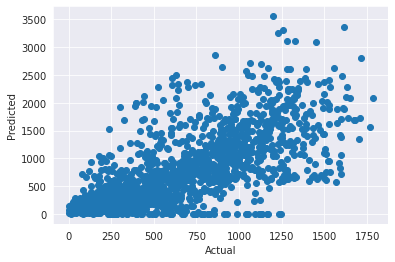

In [95]:
#Scatterplot of lasso regression
plt.scatter(y_pred_test**2, y_test**2)
plt.xlabel('Actual')
plt.ylabel('Predicted')

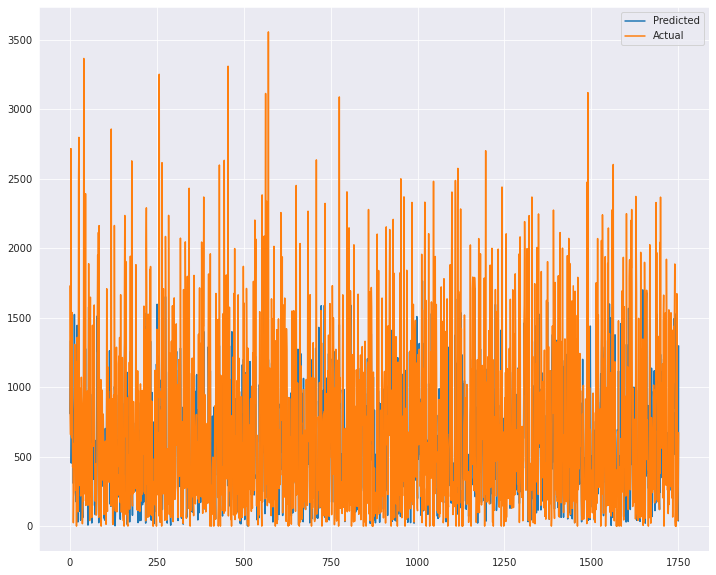

In [96]:
#Plot of actual and predicted waveform
plt.figure(figsize=(12,10))
plt.plot(y_pred_test**2)
plt.plot(np.array(y_test**2))
plt.legend(["Predicted","Actual"])
plt.show()

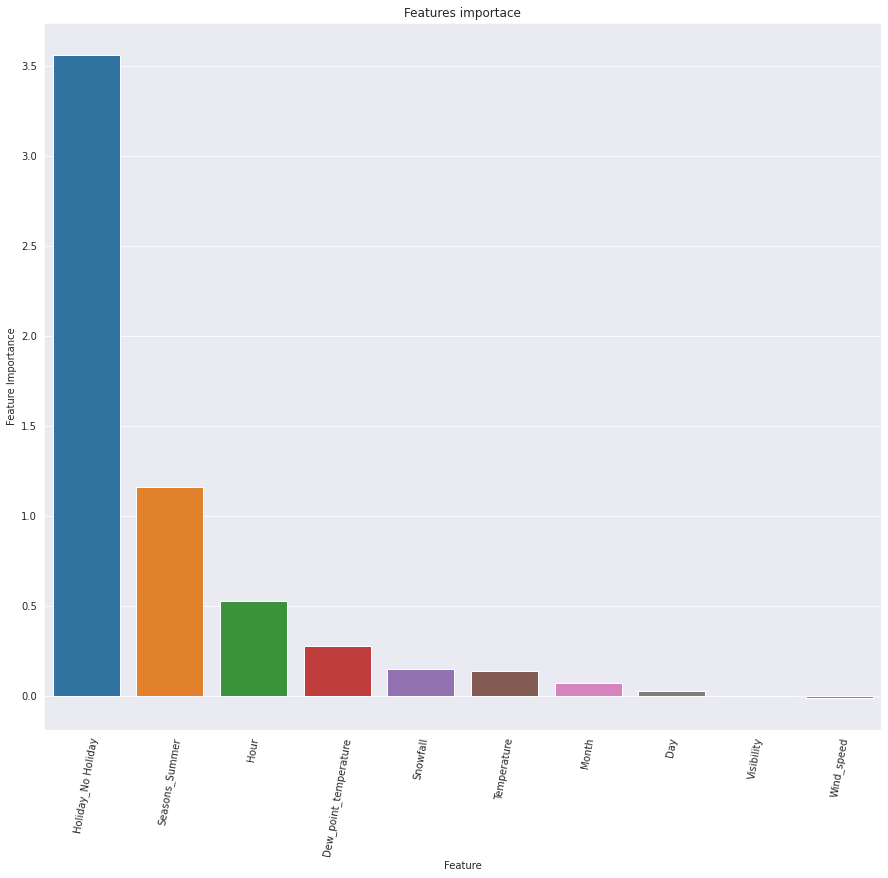

In [97]:
importances = lasso.coef_

importance_dict = {'Feature' : list(column_name),
                   'Feature Importance' : importances}

importance_df = pd.DataFrame(importance_dict)

importance_df['Feature Importance'] = round(importance_df['Feature Importance'],2)

importance_df.sort_values(by=['Feature Importance'],ascending=False,inplace=True)

plt.figure(figsize=(15,13))
plt.xticks(rotation=80)
plt.title('Features importace')
sns.barplot(x='Feature',y="Feature Importance",data=importance_df[:10])

##Ridge Regression

In [98]:
#Fit Ridge regression
from sklearn.linear_model import Ridge
ridge  = Ridge(alpha=0.1)

In [99]:
ridge.fit(X_train,y_train)

Ridge(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [100]:
ridge.score(X_train, y_train)

0.4991311269661147

In [101]:
y_pred_train = ridge.predict(X_train)

In [102]:
MAE  = mean_absolute_error(y_train**2,y_pred_train**2)
MSE  = mean_squared_error(y_train**2, y_pred_train**2)
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(y_train**2, y_pred_train**2)
print("r2 :", r2 )

#Adjusted R2 value
print("Adjusted R2 : ",1-(1-r2_score((y_train**2), (y_pred_train**2)))*((X_train.shape[0]-1)/(X_train.shape[0]-X_train.shape[1]-1)))

MAE : 311.36339990535237
MSE : 209324.68099319248
RMSE : 457.5201427185392
r2 : 0.4965810315376922
Adjusted R2 :  0.4954288782698625


In [103]:
y_pred_test = ridge.predict(X_test)

In [104]:
MAE  = mean_absolute_error(y_test**2,y_pred_test**2)
MSE  = mean_squared_error((y_test**2),(y_pred_test**2))
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score((y_test**2), (y_pred_test**2))
print("R2 :" ,r2)

print("Adjusted R2 : ",1-(1-r2_score((y_test**2), (y_pred_test**2)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

MAE : 310.4653253598294
MSE : 212181.863976524
RMSE : 460.63202665090927
R2 : 0.4907385576225808
Adjusted R2 :  0.4860421984997919


Text(0, 0.5, 'Predicted')

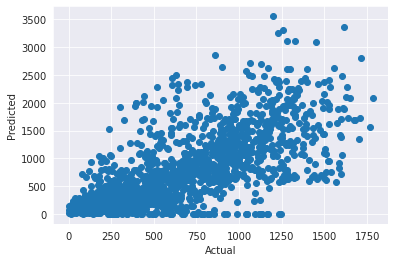

In [105]:
#Scatterplot of ridge regression
plt.scatter(y_pred_test**2, y_test**2)
plt.xlabel('Actual')
plt.ylabel('Predicted')

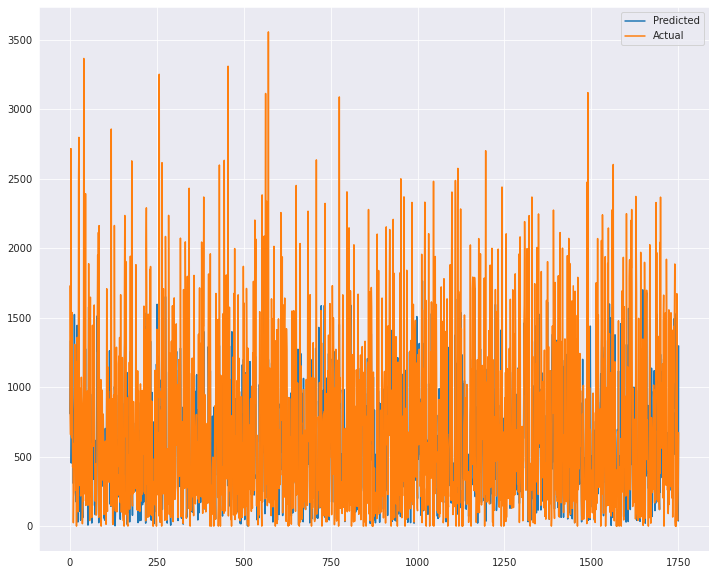

In [106]:
#Plot of actual and predicted waveform
plt.figure(figsize=(12,10))
plt.plot(y_pred_test**2)
plt.plot(np.array(y_test**2))
plt.legend(["Predicted","Actual"])
plt.show()

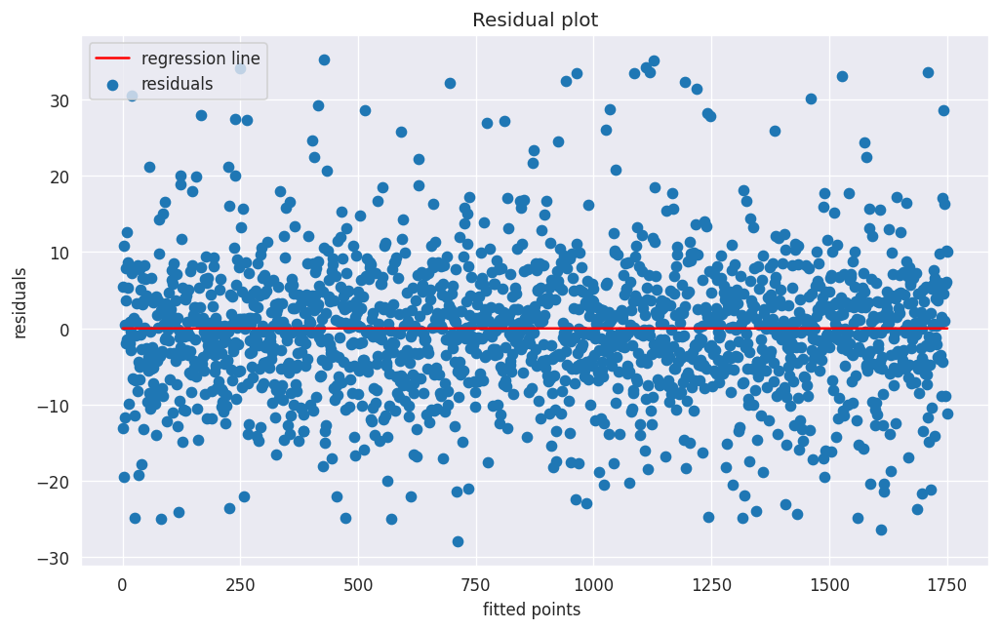

In [107]:
#Heteroskedasticity
residuals=y_pred_test-y_test

plt.figure(figsize=(10, 6), dpi=120, facecolor='w', edgecolor='b')
f = range(0,len(y_test))
k = [0 for i in range(0,len(y_test))]
plt.scatter( f, residuals, label = 'residuals')
plt.plot( f, k , color = 'red', label = 'regression line' )
plt.xlabel('fitted points ')
plt.ylabel('residuals')
plt.title('Residual plot')
plt.legend()

In [108]:
#Hyperprarameter tuning using GridSearchCV
from sklearn.model_selection import GridSearchCV
ridge = Ridge()
parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1,5,10,20,30,40,45,50,55,60,100]}
ridge_regressor = GridSearchCV(ridge, parameters, scoring='neg_mean_squared_error', cv=3)
ridge_regressor.fit(X_train,y_train)

GridSearchCV(cv=3, error_score=nan,
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': [1e-15, 1e-13, 1e-10, 1e-08, 1e-05, 0.0001,
                                   0.001, 0.01, 1, 5, 10, 20, 30, 40, 45, 50,
                                   55, 60, 100]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='neg_mean_squared_error', verbose=0)

In [109]:
print("The best fit alpha value is found out to be :" ,ridge_regressor.best_params_)

The best fit alpha value is found out to be : {'alpha': 5}


In [110]:
print("\nUsing ",ridge_regressor.best_params_, " the best score is: ", ridge_regressor.best_score_)


Using  {'alpha': 5}  the best score is:  -78.12949447961091


In [111]:
y_pred_train = ridge_regressor.predict(X_train)

In [112]:
MAE  = mean_absolute_error(y_train**2,y_pred_train**2)
MSE  = mean_squared_error(y_train**2, y_pred_train**2)
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(y_train**2, y_pred_train**2)
print("r2 :", r2 )

#Adjusted R2 value
print("Adjusted R2 : ",1-(1-r2_score((y_train**2), (y_pred_train**2)))*((X_train.shape[0]-1)/(X_train.shape[0]-X_train.shape[1]-1)))

MAE : 311.4153215434937
MSE : 209388.80581338072
RMSE : 457.5902160376473
r2 : 0.49642681345562545
Adjusted R2 :  0.4952743072355268


In [113]:
#Model Prediction
y_pred_test = ridge_regressor.predict(X_test)

In [114]:
MAE  = mean_absolute_error(y_test**2,y_pred_test**2)
MSE  = mean_squared_error((y_test**2), (y_pred_test**2))
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score((y_test**2), (y_pred_test**2))
print("R2 :" ,r2)

print("Adjusted R2 : ",1-(1-r2_score((y_test**2), (y_pred_test**2)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

MAE : 310.5162892627538
MSE : 212252.89536361565
RMSE : 460.7091222925976
R2 : 0.4905680739348308
Adjusted R2 :  0.48587014262817796


Text(0, 0.5, 'Predicted')

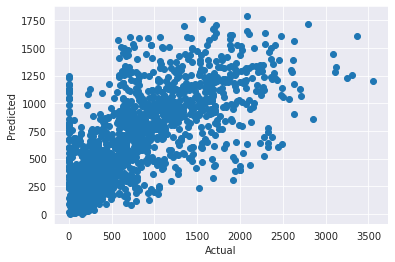

In [115]:
#Scatterplot of ridge regression
plt.scatter(y_test**2, y_pred_test**2)
plt.xlabel('Actual')
plt.ylabel('Predicted')

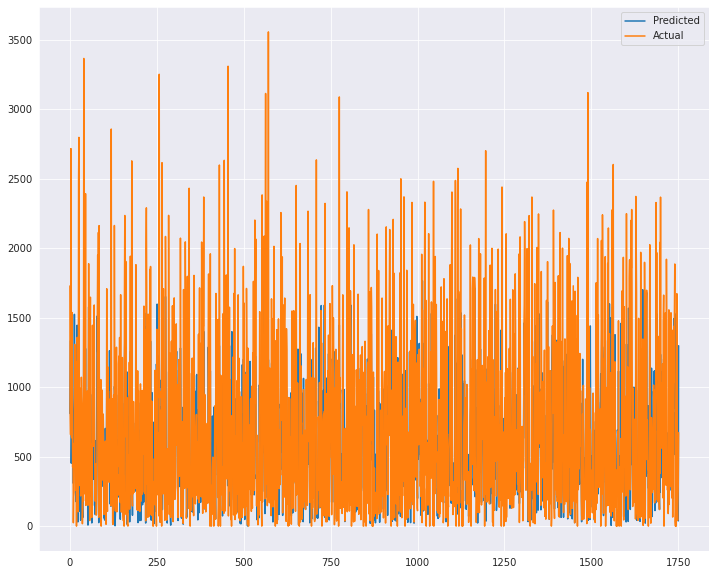

In [116]:
#Plot of actual and predicted waveform
plt.figure(figsize=(12,10))
plt.plot(y_pred_test**2)
plt.plot(np.array(y_test**2))
plt.legend(["Predicted","Actual"])
plt.show()

##Decision Tree Regressor Algorithm

In [117]:
#Import libraries for decision tree algorithm
from sklearn.tree import DecisionTreeRegressor
tree_reg = DecisionTreeRegressor()

In [118]:
#Fitting the values
tree_reg.fit(X_train,y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [119]:
y_pred_train = tree_reg.predict(X_train)

In [120]:
MAE  = mean_absolute_error(y_train**2,y_pred_train**2)
MSE  = mean_squared_error(y_train**2, y_pred_train**2)
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(y_train**2, y_pred_train**2)
print("r2 :", r2 )

#Adjusted R2 value
print("Adjusted R2 : ",1-(1-r2_score((y_train**2), (y_pred_train**2)))*((X_train.shape[0]-1)/(X_train.shape[0]-X_train.shape[1]-1)))

MAE : 0.0
MSE : 0.0
RMSE : 0.0
r2 : 1.0
Adjusted R2 :  1.0


In [121]:
#Predicted value
y_pred_test=tree_reg.predict(X_test)

In [122]:
#MSE RMSE and MAE values
MSE  = mean_squared_error(y_test**2, y_pred_test**2)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

MAE  = mean_absolute_error(y_test**2, y_pred_test**2)
print("MAE :" , MAE)

#R2 value
r2=r2_score(y_test, y_pred_test)
print("R2 :" , r2)

#Adjusted R2 value
print("Adjusted R2 : ",1-(1-r2_score((y_test**2), (y_pred_test**2)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

MSE : 129562.6649543379
RMSE : 359.94814203484634
MAE : 199.1090182648402
R2 : 0.6294292239031516
Adjusted R2 :  0.6861666629349288


Text(0, 0.5, 'Predicted')

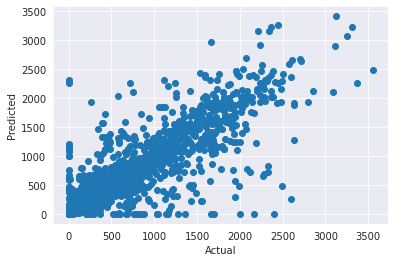

In [123]:
#Scatterplot of decision tree
plt.scatter(y_test**2, y_pred_test**2)
plt.xlabel('Actual')
plt.ylabel('Predicted')

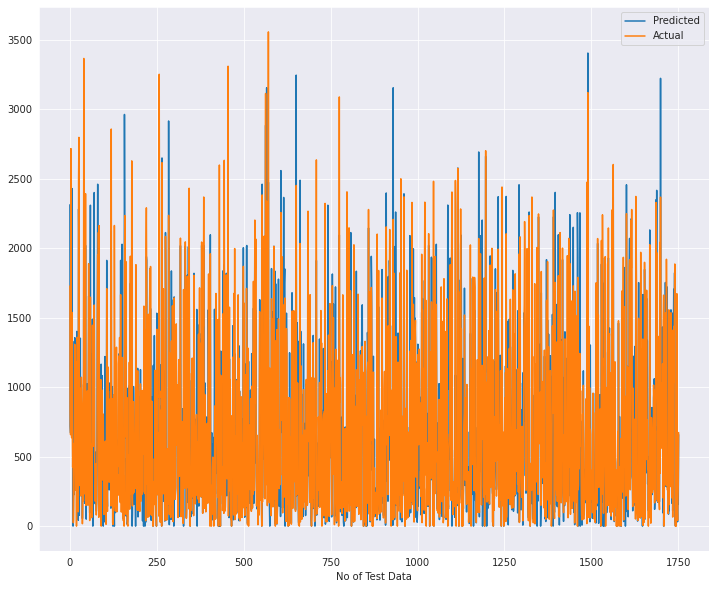

In [124]:
#Decision tree predicted vs actual waveform
plt.figure(figsize=(12,10))
plt.plot(y_pred_test**2)
plt.plot(np.array(y_test**2))
plt.legend(["Predicted","Actual"])
plt.xlabel('No of Test Data')
plt.show()

In [125]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import tree
from IPython.display import SVG
from graphviz import Source
from IPython.display import display

In [126]:
plt.figure(figsize=(5,5))
graph = Source(tree.export_graphviz(tree_reg, out_file=None, feature_names=X_train.columns,filled= True))
display(SVG(graph.pipe(format='svg')))

<Figure size 360x360 with 0 Axes>

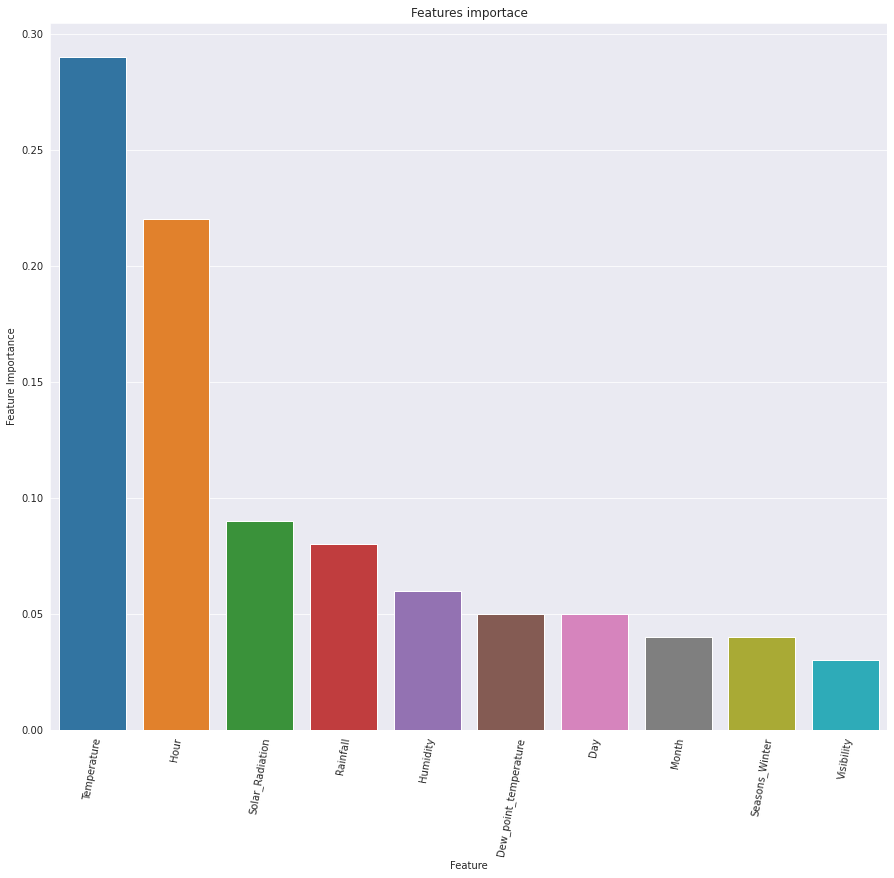

In [127]:
importances = tree_reg.feature_importances_

importance_dict = {'Feature' : list(column_name),
                   'Feature Importance' : importances}

importance_df = pd.DataFrame(importance_dict)

importance_df['Feature Importance'] = round(importance_df['Feature Importance'],2)

importance_df.sort_values(by=['Feature Importance'],ascending=False,inplace=True)

plt.figure(figsize=(15,13))
plt.xticks(rotation=80)
plt.title('Features importace')
sns.barplot(x='Feature',y="Feature Importance",data=importance_df[:10])

##Random Forest Regressor Algorithm

In [128]:
#Import libraries for Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor   
regressor = RandomForestRegressor(n_estimators = 100, random_state =42) 

In [129]:
#Fit the regressor with x and y data 
y_test=np.sqrt(y_test)
y_train=np.sqrt(y_train)
regressor.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=42, verbose=0, warm_start=False)

In [130]:
y_pred_train = regressor.predict(X_train)

In [131]:
MAE  = mean_absolute_error(y_train**2,y_pred_train**2)
MSE  = mean_squared_error(y_train**2, y_pred_train**2)
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(y_train**2, y_pred_train**2)
print("r2 :", r2 )

#Adjusted R2 value
print("Adjusted R2 : ",1-(1-r2_score((y_train**2), (y_pred_train**2)))*((X_train.shape[0]-1)/(X_train.shape[0]-X_train.shape[1]-1)))

MAE : 1.1774579250680204
MSE : 3.646391397765381
RMSE : 1.9095526695447238
r2 : 0.9765176865570895
Adjusted R2 :  0.9764639435997033


In [132]:
#Predicted value
y_pred_test = regressor.predict(X_test)

In [133]:
#MAE MSE RMSE and R2 values
MAE  = mean_absolute_error(y_test**2,y_pred_test**2)
MSE  = mean_squared_error(y_test**2, y_pred_test**2)
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(y_test**2, y_pred_test**2)
print("R2 :" ,r2)

#Adjusted R2 value
print("Adjusted R2 : ",1-(1-r2_score((y_test**2), (y_pred_test**2)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

MAE : 3.374924151702243
MSE : 28.34936135376134
RMSE : 5.324411831720132
R2 : 0.8158134789508122
Adjusted R2 :  0.814114928900791


Text(0, 0.5, 'Predicted')

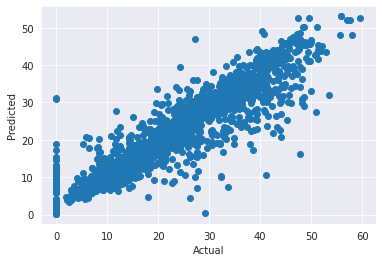

In [134]:
#Scatterplot of random forest regressor regression
plt.scatter(y_test**2, y_pred_test**2)
plt.xlabel('Actual')
plt.ylabel('Predicted')

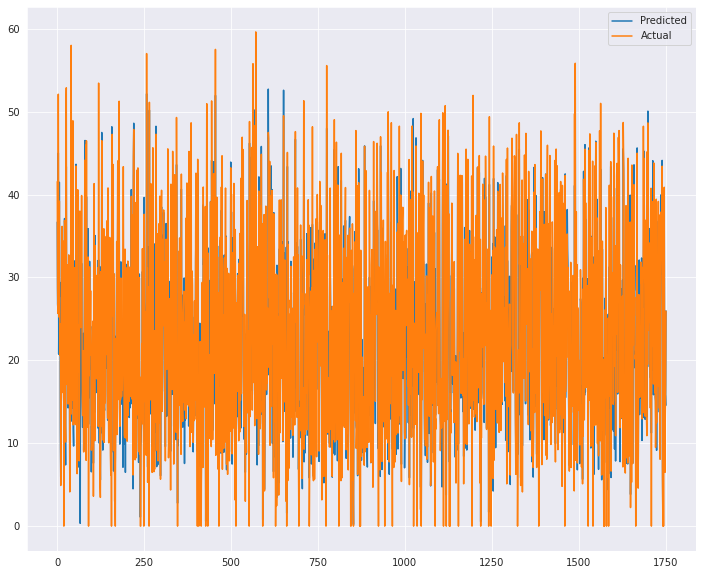

In [135]:
#Plot of actual and predicted waveform
plt.figure(figsize=(12,10))
plt.plot(y_pred_test**2)
plt.plot(np.array(y_test**2))
plt.legend(["Predicted","Actual"])
plt.show()

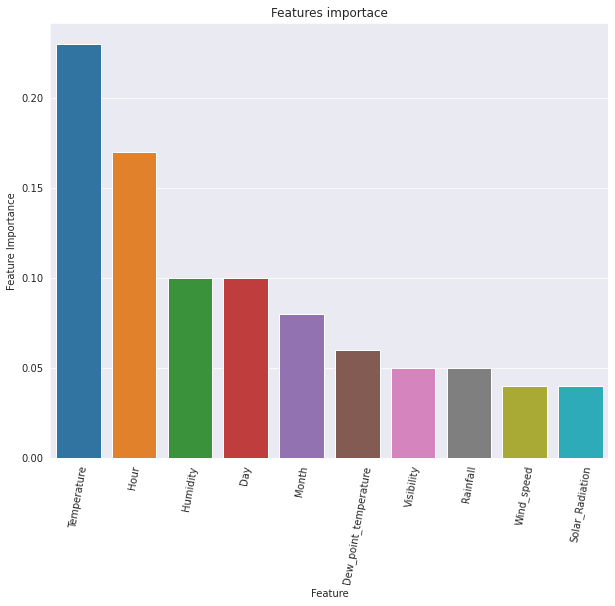

In [136]:
importances = regressor.feature_importances_

importance_dict = {'Feature' : list(column_name),
                   'Feature Importance' : importances}

importance_df = pd.DataFrame(importance_dict)

importance_df['Feature Importance'] = round(importance_df['Feature Importance'],2)

importance_df.sort_values(by=['Feature Importance'],ascending=False,inplace=True)

plt.figure(figsize=(10,8))
plt.xticks(rotation=80)
plt.title('Features importace')
sns.barplot(x='Feature',y="Feature Importance",data=importance_df[:10])

##XGboost Algorithm

In [137]:
#Import XGboost and fitting XGboost
import xgboost as xgb
xg= xgb.XGBRegressor()

In [138]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.30, random_state=42)

In [139]:
xg.fit(X_train, y_train)

[08:04:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [140]:
y_pred_train = xg.predict(X_train)

In [141]:
MAE  = mean_absolute_error(y_train**2,y_pred_train**2)
MSE  = mean_squared_error(y_train**2, y_pred_train**2)
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(y_train**2, y_pred_train**2)
print("r2 :", r2 )

#Adjusted R2 value
print("Adjusted R2 : ",1-(1-r2_score((y_train**2), (y_pred_train**2)))*((X_train.shape[0]-1)/(X_train.shape[0]-X_train.shape[1]-1)))

MAE : 185.09811429342284
MSE : 87804.8312915986
RMSE : 296.31880009813517
r2 : 0.7902471000436404
Adjusted R2 :  0.7896638813162511


In [142]:
y_pred_test = xg.predict(X_test)

In [143]:
MAE  = mean_absolute_error(y_test**2,y_pred_test**2)
MSE  = mean_squared_error((y_test**2), (y_pred_test**2))
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score((y_test**2), (y_pred_test**2))
print("R2 :" ,r2)

print("Adjusted R2 : ",1-(1-r2_score((y_test**2), (y_pred_test**2)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

MAE : 189.97340570673165
MSE : 96421.50236728693
RMSE : 310.51811922541157
R2 : 0.7647051481083196
Adjusted R2 :  0.7631725762760749


In [144]:
train_score = xg.score(X_train, y_train)
test_score = xg.score(X_test,y_test)
print('Train score: ',train_score)
print('Test score: ',test_score)

Train score:  0.7600931387679238
Test score:  0.7453348367456017


Text(0, 0.5, 'Predicted')

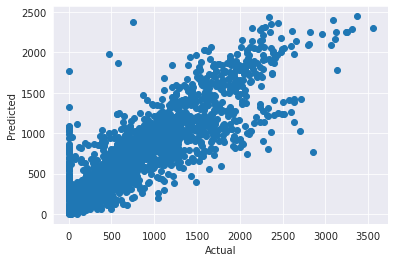

In [145]:
#Scatterplot of XGBoost 
plt.scatter(y_test**2, y_pred_test**2)
plt.xlabel('Actual')
plt.ylabel('Predicted')

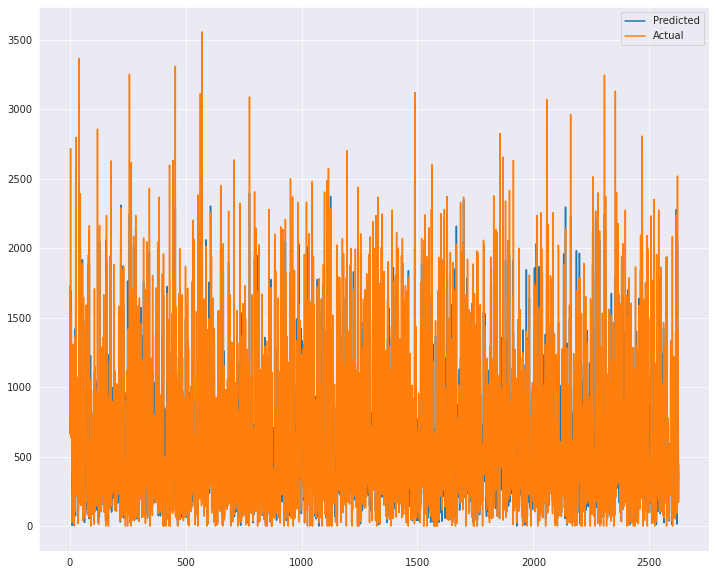

In [146]:
#Plot of actual and predicted waveform
plt.figure(figsize=(12,10))
plt.plot(y_pred_test**2)
plt.plot(np.array(y_test**2))
plt.legend(["Predicted","Actual"])
plt.show()

Feature: 0, Score: 0.00000
Feature: 1, Score: 0.09411
Feature: 2, Score: 0.19723
Feature: 3, Score: 0.10362
Feature: 4, Score: 0.01060
Feature: 5, Score: 0.02798
Feature: 6, Score: 0.02016
Feature: 7, Score: 0.07181
Feature: 8, Score: 0.12551
Feature: 9, Score: 0.00431
Feature: 10, Score: 0.02069
Feature: 11, Score: 0.02359
Feature: 12, Score: 0.02308
Feature: 13, Score: 0.03777
Feature: 14, Score: 0.02363
Feature: 15, Score: 0.19321
Feature: 16, Score: 0.02271


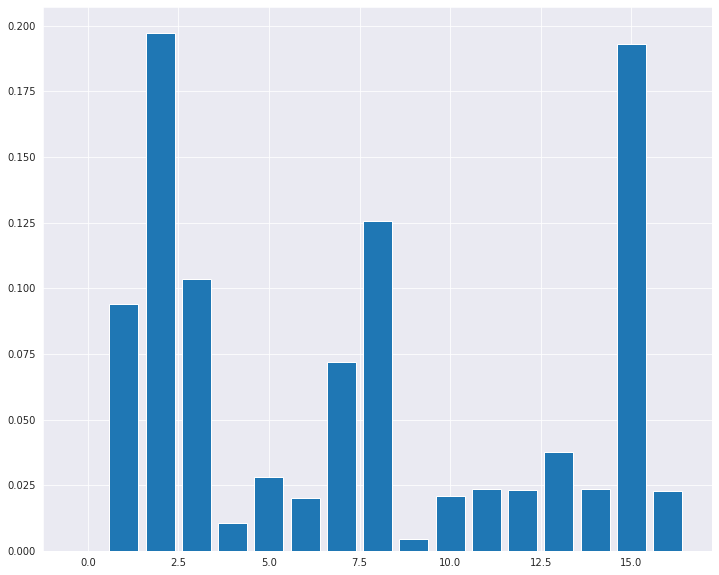

In [147]:
#Decision tree feature importance on a regression 
from sklearn.datasets import make_regression

#Define dataset
X, y = make_regression(n_samples=1000, n_features=20, n_informative=5, random_state=1)

#Get importance
importance = xg.feature_importances_

#Summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

#Plot feature importance
plt.figure(figsize=(12,10))
plt.bar([x for x in range(len(importance))], importance)
plt.show()

In [148]:
import warnings
from sklearn.model_selection import GridSearchCV
warnings.filterwarnings('ignore')
import xgboost as xgb

xgb = xgb.XGBRegressor(random_state=42)

In [149]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.30, random_state=42)

In [150]:
#Setting parameters
params = {"min_child_weight":[10,20], 
            'eta': [0.004,0.04,6,40], 
            'colsample_bytree':[0.7], 
            'max_depth': [7,9,11],
          }

In [151]:
#Fitting the data
reg_gs = GridSearchCV(xgb,param_grid=params, verbose=2,cv=5)
reg_gs.fit(X, y)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV] colsample_bytree=0.7, eta=0.004, max_depth=7, min_child_weight=10 
[08:04:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  colsample_bytree=0.7, eta=0.004, max_depth=7, min_child_weight=10, total=   0.2s
[CV] colsample_bytree=0.7, eta=0.004, max_depth=7, min_child_weight=10 
[08:04:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV]  colsample_bytree=0.7, eta=0.004, max_depth=7, min_child_weight=10, total=   0.2s
[CV] colsample_bytree=0.7, eta=0.004, max_depth=7, min_child_weight=10 
[08:04:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  colsample_bytree=0.7, eta=0.004, max_depth=7, min_child_weight=10, total=   0.2s
[CV] colsample_bytree=0.7, eta=0.004, max_depth=7, min_child_weight=10 
[08:04:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  colsample_bytree=0.7, eta=0.004, max_depth=7, min_child_weight=10, total=   0.2s
[CV] colsample_bytree=0.7, eta=0.004, max_depth=7, min_child_weight=10 
[08:04:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  colsample_bytree=0.7, eta=0.004, max_depth=7, min_child_weight=10, total=   0.2s
[CV] colsample_bytree=0.7, eta=0.004, max_depth=7, min_

[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:   26.5s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                    colsample_bylevel=1, colsample_bynode=1,
                                    colsample_bytree=1, gamma=0,
                                    importance_type='gain', learning_rate=0.1,
                                    max_delta_step=0, max_depth=3,
                                    min_child_weight=1, missing=None,
                                    n_estimators=100, n_jobs=1, nthread=None,
                                    objective='reg:linear', random_state=42,
                                    reg_alpha=0, reg_lambda=1,
                                    scale_pos_weight=1, seed=None, silent=None,
                                    subsample=1, verbosity=1),
             iid='deprecated', n_jobs=None,
             param_grid={'colsample_bytree': [0.7], 'eta': [0.004, 0.04, 6, 40],
                         'max_depth': [7, 9, 11],


In [152]:
#Best parameters of XGboost
reg_gs.best_estimator_.get_params()

{'base_score': 0.5,
 'booster': 'gbtree',
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 0.7,
 'eta': 0.004,
 'gamma': 0,
 'importance_type': 'gain',
 'learning_rate': 0.1,
 'max_delta_step': 0,
 'max_depth': 7,
 'min_child_weight': 20,
 'missing': None,
 'n_estimators': 100,
 'n_jobs': 1,
 'nthread': None,
 'objective': 'reg:linear',
 'random_state': 42,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'scale_pos_weight': 1,
 'seed': None,
 'silent': None,
 'subsample': 1,
 'verbosity': 1}

In [153]:
#Assigning best estimators to variable
reg_optimal_model =reg_gs.best_estimator_

In [154]:
#Optimal model score of train data
reg_optimal_model.score(X_train, y_train)

0.9958942659300728

In [155]:
y_pred_train = reg_optimal_model.predict(X_train)

In [156]:
MAE  = mean_absolute_error(y_train**2,y_pred_train**2)
MSE  = mean_squared_error(y_train**2, y_pred_train**2)
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(y_train**2, y_pred_train**2)
print("r2 :", r2 )

#Adjusted R2 value
print("Adjusted R2 : ",1-(1-r2_score((y_train**2), (y_pred_train**2)))*((X_train.shape[0]-1)/(X_train.shape[0]-X_train.shape[1]-1)))

MAE : 783.3534340629452
MSE : 9551047.812626481
RMSE : 3090.476955524257
r2 : 0.9573079882877455
Adjusted R2 :  0.9560504916246453


In [157]:
#Optimal model score of test data
reg_optimal_model.score(X_test,y_test)

0.997154540739111

In [158]:
y_pred_test = reg_optimal_model.predict(X_test)

In [159]:
MAE  = mean_absolute_error(y_test**2,y_pred_test**2)
MSE  = mean_squared_error((y_test**2), (y_pred_test**2))
print("MAE :" , MAE)
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score((y_test**2), (y_pred_test**2))
print("R2 :" ,r2)

print("Adjusted R2 : ",1-(1-r2_score((y_test**2), (y_pred_test**2)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

MAE : 788.8426966617284
MSE : 2696665.461321412
RMSE : 1642.1526912322777
R2 : 0.987081163760265
Adjusted R2 :  0.986155082309388


Text(0, 0.5, 'Predicted')

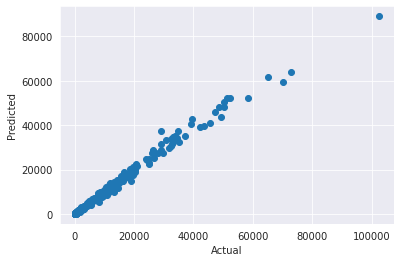

In [160]:
#Scatterplot of XGboost
plt.scatter(y_test**2, y_pred_test**2)
plt.xlabel('Actual')
plt.ylabel('Predicted')

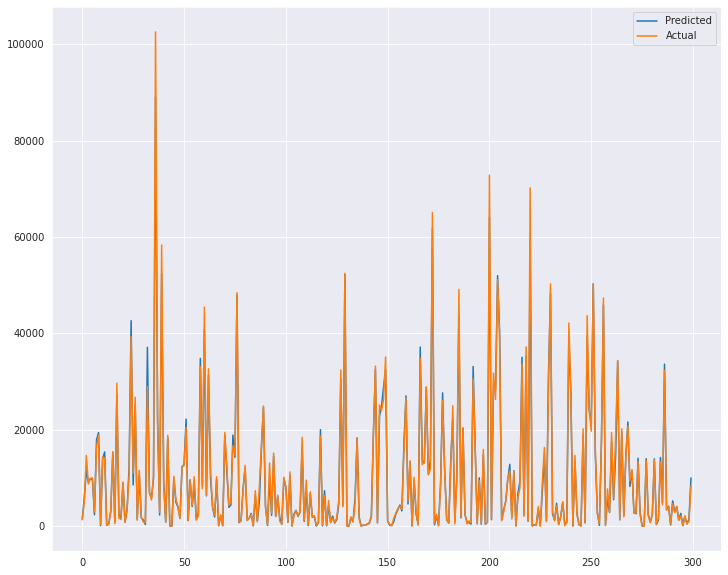

In [161]:
#Plot of actual and predicted waveform
plt.figure(figsize=(12,10))
plt.plot(y_pred_test**2)
plt.plot(np.array(y_test**2))
plt.legend(["Predicted","Actual"])
plt.show()

##Conclusion

* There is an high demand for Rented Bikes in the year 2018 .
* There is an high demand for Rented Bikes in the month of May, June, and July .
* There is an high demand for Rented Bikes in the day 6 , 7 and 9 .
* There is an high demand for Rented Bikes in the hour 17 , 18 & 19 .
* Summer season has highest Demand for Rented bikes and Winter has least Demand.
* No Holiday has higher Demand compare to Holiday .
* The features hour & temperature are the features that influence the most of the bike sharing count data
* Linear Regression fit gives upto 49% of model score and about 48% of Dependent variable's variance is explained by Independent variables, This seems to be improved. 
* Comparing to all algorithms XGboost algorithm has less Mean Squared error and Mean absolute error,and gives a model score upto 99% and R-Squared value is 98%, so it is concluded as optimal model.  
